# <center> **Data Preperation**</center>


***
$\mathbf{\text{Importing libraries}}$<br>
*** 


In [3]:
import pandas as pd
import pandas_profiling
import pprint
from imblearn.over_sampling import SMOTE
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
import math
import researchpy as rp
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import scale 
from sklearn import model_selection
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score,StratifiedKFold
from sklearn.model_selection import cross_val_predict # prediction with CV
from sklearn.model_selection import train_test_split
from IPython.display import display_html
from itertools import chain,cycle
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score, recall_score, confusion_matrix
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import Ridge
from imblearn.over_sampling import SMOTENC
import time
from sklearn.feature_selection import chi2
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoLarsIC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import accuracy_score,f1_score,roc_auc_score,confusion_matrix,roc_curve
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_score
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from keras import Sequential
from keras.layers import Dense, Dropout
from keras.callbacks import EarlyStopping
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from keras.utils import np_utils
from astropy.table import Table

pd.set_option('max_columns',None)
%matplotlib inline
plt.style.use("fivethirtyeight")


***
$\mathbf{\text{Importing Data}}$<br>
***

In [134]:
person = pd.read_csv("perpub.csv")
vehicle = pd.read_csv("vehpub.csv")
household = pd.read_csv("hhpub.csv")

In [135]:
person.head()

,HOUSEID,PERSONID,R_AGE,EDUC,R_HISP,R_RELAT,R_SEX,R_RACE,PRMACT,PAYPROF,GT1JBLWK,WRK_HOME,WKFTPT,WRKTRANS,LSTTRDAY17,OCCAT,SCHTYP,NWALKTRP,WALK4EX,NBIKETRP,BIKE4EX,BIKESHARE,PTUSED,MCUSED,CARSHARE,RIDESHARE,CARRODE,TIMETOWK,NOCONG,PUBTIME,WRKTIME,WKRMHM,FLEXTIME,WKFMHMXX,SCHTRN1,SCHTRN2,DELIVER,MEDCOND,MEDCOND6,HEALTH,PHYACT,VPACT,LPACT,BORNINUS,YRTOUS,YEARMILE,PROXY,WHOPROXY,USEPUBTR,SAMEPLC,W_NONE,W_CANE,W_WLKR,W_WHCANE,W_DOG,W_CRUTCH,W_SCOOTR,W_CHAIR,W_MTRCHR,WORKER,DIARY,OUTCNTRY,FRSTHM17,CNTTDTR,GCDWORK,WKSTFIPS,DRIVER,OUTOFTWN,DISTTOWK17,DISTTOSC17,R_AGE_IMP,R_SEX_IMP,ALT_16,ALT_23,ALT_45,WALK_DEF,WALK_GKQ,BIKE_DFR,BIKE_GKP,CONDTRAV,CONDRIDE,CONDNIGH,CONDRIVE,CONDPUB,CONDSPEC,CONDTAX,TRAVDAY,HOMEOWN,HHSIZE,HHVEHCNT,HHFAMINC,DRVRCNT,HHSTATE,HHSTFIPS,NUMADLT,WRKCOUNT,TDAYDATE,HHRESP,LIF_CYC,MSACAT,MSASIZE,RAIL,URBAN,URBANSIZE,URBRUR,CENSUS_D,CENSUS_R,CDIVMSAR,HH_RACE,HH_HISP,HH_CBSA,SMPLSRCE,WTPERFIN,HBHUR,HTHTNRNT,HTPPOPDN,HTRESDN,HTEEMPDN,HBHTNRNT,HBPPOPDN,HBRESDN
0,30000007,1,67,3,2,1,2,2,6,2,-1,-1,-1,-1,-1,-1,-1,3,3,0,-1,-1,0,-1,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,2,2,-1,2,2,-1,0,1,-1,1000,1,1,2,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,2,2,2,1,2,-9.00,-9,1,2,-9.00,-9.0,67,2,3,1,4,3,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,2,1,3,5,7,3,NC,37,3,1,201608,1,10,3,1,2,1,1,1,5,3,53,2,2,XXXXX,2,206.690153,T,50,1500,750,750,20,750,300
1,30000007,2,66,3,2,2,1,2,1,-1,2,2,1,6,-1,2,-1,7,0,0,-1,-1,0,-1,0,0,1,120,90,-1,08:30 PM,2,2,-1,-1,-1,5,2,-1,2,2,-1,7,1,-1,10000,2,1,2,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,2,2,2,2,58.58,37,1,2,82.61,-9.0,66,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,2,1,3,5,7,3,NC,37,3,1,201608,1,10,3,1,2,1,1,1,5,3,53,2,2,XXXXX,2,197.075742,T,50,1500,750,750,20,750,300
2,30000007,3,28,2,2,3,2,2,5,2,-1,-1,-1,-1,-1,-1,-1,7,0,0,-1,-1,0,-1,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,2,-1,2,2,-1,2,1,-1,1000,2,1,2,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,2,2,2,1,2,-9.00,-9,1,2,-9.00,-9.0,28,2,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,2,1,3,5,7,3,NC,37,3,1,201608,1,10,3,1,2,1,1,1,5,3,53,2,2,XXXXX,2,219.514210,T,50,1500,750,750,20,750,300
3,30000008,1,55,5,2,1,1,1,1,-1,2,2,1,6,-1,4,-1,5,0,0,-1,-1,0,-1,0,0,1,10,10,-1,06:15 AM,2,2,-1,-1,-1,0,2,-1,2,3,7,-1,1,-1,12000,1,1,2,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,2,2,1,2,5.53,55,1,2,8.11,-9.0,55,1,4,4,4,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,5,1,2,4,8,2,WI,55,2,2,201608,2,2,2,5,2,4,6,2,3,2,32,1,2,33460,2,63.185911,R,5,300,300,150,5,300,300
4,30000008,2,49,4,2,2,2,1,1,-1,2,2,1,3,1,2,-1,0,-1,0,-1,-1,0,-1,0,0,1,5,4,-1,09:00 AM,2,2,-1,-1,-1,0,2,-1,2,2,-1,7,1,-1,10000,1,2,2,10,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,1,2,1,0,2.22,55,1,2,3.07,-9.0,49,2,4,1,4,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,5,1,2,4,8,2,WI,55,2,2,201608,2,2,2,5,2,4,6,2,3,2,32,1,2,33460,2,58.665911,R,5,300,300,150,5,300,300


In [136]:
vehicle.head()

,HOUSEID,VEHID,VEHYEAR,VEHAGE,MAKE,MODEL,FUELTYPE,VEHTYPE,WHOMAIN,OD_READ,HFUEL,VEHOWNED,VEHOWNMO,ANNMILES,HYBRID,PERSONID,TRAVDAY,HOMEOWN,HHSIZE,HHVEHCNT,HHFAMINC,DRVRCNT,HHSTATE,HHSTFIPS,NUMADLT,WRKCOUNT,TDAYDATE,LIF_CYC,MSACAT,MSASIZE,RAIL,URBAN,URBANSIZE,URBRUR,CENSUS_D,CENSUS_R,CDIVMSAR,HH_RACE,HH_HISP,HH_CBSA,SMPLSRCE,WTHHFIN,BESTMILE,BEST_FLG,BEST_EDT,BEST_OUT,HBHUR,HTHTNRNT,HTPPOPDN,HTRESDN,HTEEMPDN,HBHTNRNT,HBPPOPDN,HBRESDN,GSYRGAL,GSTOTCST,FEGEMPG,FEGEMPGA,GSCOST,FEGEMPGF
0,30000007,1,2007,10,49,49032,1,1,3,69000,-1,1,-1,1000,2,3,2,1,3,5,7,3,NC,37,3,1,201608,10,3,1,2,1,1,1,5,3,53,2,2,XXXXX,2,187.31432,14611.926637,1,-1,4,T,50,1500,750,750,20,750,300,487.064221,1126.457778,30,-9,2.31275,1
1,30000007,2,2004,13,49,49442,1,2,-8,164000,-1,1,-1,2500,2,-8,2,1,3,5,7,3,NC,37,3,1,201608,10,3,1,2,1,1,1,5,3,53,2,2,XXXXX,2,187.31432,4767.090946,3,-1,-1,T,50,1500,750,750,20,750,300,250.899523,580.267873,19,-9,2.31275,1
2,30000007,3,1998,19,19,19014,1,1,1,120000,-1,1,-1,900,2,1,2,1,3,5,7,3,NC,37,3,1,201608,10,3,1,2,1,1,1,5,3,53,2,2,XXXXX,2,187.31432,8000.324552,1,-1,-1,T,50,1500,750,750,20,750,300,444.462475,1027.930589,18,-9,2.31275,1
3,30000007,4,1997,20,19,19021,1,1,2,-88,-1,1,-1,500,2,2,2,1,3,5,7,3,NC,37,3,1,201608,10,3,1,2,1,1,1,5,3,53,2,2,XXXXX,2,187.31432,725.932347,2,-1,-1,T,50,1500,750,750,20,750,300,40.329575,93.272224,18,-9,2.31275,1
4,30000007,5,1993,24,20,20481,1,4,2,300000,-1,1,-1,10000,2,2,2,1,3,5,7,3,NC,37,3,1,201608,10,3,1,2,1,1,1,5,3,53,2,2,XXXXX,2,187.31432,12437.658757,1,-1,-1,T,50,1500,750,750,20,750,300,888.404197,2054.656806,14,-9,2.31275,1


In [137]:
household.head()

,HOUSEID,TRAVDAY,SAMPSTRAT,HOMEOWN,HHSIZE,HHVEHCNT,HHFAMINC,PC,SPHONE,TAB,WALK,BIKE,CAR,TAXI,BUS,TRAIN,PARA,PRICE,PLACE,WALK2SAVE,BIKE2SAVE,PTRANS,HHRELATD,DRVRCNT,CNTTDHH,HHSTATE,HHSTFIPS,NUMADLT,YOUNGCHILD,WRKCOUNT,TDAYDATE,HHRESP,LIF_CYC,MSACAT,MSASIZE,RAIL,URBAN,URBANSIZE,URBRUR,SCRESP,CENSUS_D,CENSUS_R,CDIVMSAR,HH_RACE,HH_HISP,HH_CBSA,RESP_CNT,WEBUSE17,SMPLSRCE,WTHHFIN,HBHUR,HTHTNRNT,HTPPOPDN,HTRESDN,HTEEMPDN,HBHTNRNT,HBPPOPDN,HBRESDN
0,30000007,2,3,1,3,5,7,2,1,2,5,5,1,5,4,5,5,1,2,4,4,4,1,3,6,NC,37,3,0,1,201608,1,10,3,1,2,1,1,1,1,5,3,53,2,2,XXXXX,3,1,2,187.314320,T,50,1500,750,750,20,750,300
1,30000008,5,2,1,2,4,8,1,1,2,4,4,1,5,5,5,5,5,2,4,4,5,1,2,2,WI,55,2,0,2,201608,2,2,2,5,2,4,6,2,1,3,2,32,1,2,33460,2,1,2,69.513032,R,5,300,300,150,5,300,300
2,30000012,5,3,1,1,2,10,1,1,3,2,5,1,5,4,4,5,2,1,2,3,5,2,1,9,NY,36,1,0,1,201607,1,1,3,3,2,1,3,1,1,2,1,23,1,2,XXXXX,1,1,2,79.419586,C,80,17000,17000,5000,60,17000,7000
3,30000019,5,3,1,2,2,3,1,5,5,2,5,1,5,5,5,5,2,3,2,3,3,1,2,4,MD,24,2,0,0,201605,1,2,3,2,2,1,1,1,1,5,3,53,1,2,XXXXX,2,1,2,279.143588,S,40,300,300,150,50,750,300
4,30000029,3,3,1,2,2,5,2,5,1,-9,-9,1,-9,-9,-9,-9,3,2,5,5,5,1,2,10,WI,55,2,0,0,201610,1,10,3,3,2,1,2,1,1,3,2,33,1,2,XXXXX,2,1,2,103.240304,S,40,1500,750,750,40,1500,750


<br>
<br>
 In NHTS documentation 'HHRESP' variable in household table is the person id number of the household respondant, therefore we renamed this variable by 'PERSONID' in order to be abel to merge all 3 tables together.
<br>
<br>

In [138]:
household.rename(columns = {'HHRESP' : 'PERSONID'}, inplace = True)
household.head()

,HOUSEID,TRAVDAY,SAMPSTRAT,HOMEOWN,HHSIZE,HHVEHCNT,HHFAMINC,PC,SPHONE,TAB,WALK,BIKE,CAR,TAXI,BUS,TRAIN,PARA,PRICE,PLACE,WALK2SAVE,BIKE2SAVE,PTRANS,HHRELATD,DRVRCNT,CNTTDHH,HHSTATE,HHSTFIPS,NUMADLT,YOUNGCHILD,WRKCOUNT,TDAYDATE,PERSONID,LIF_CYC,MSACAT,MSASIZE,RAIL,URBAN,URBANSIZE,URBRUR,SCRESP,CENSUS_D,CENSUS_R,CDIVMSAR,HH_RACE,HH_HISP,HH_CBSA,RESP_CNT,WEBUSE17,SMPLSRCE,WTHHFIN,HBHUR,HTHTNRNT,HTPPOPDN,HTRESDN,HTEEMPDN,HBHTNRNT,HBPPOPDN,HBRESDN
0,30000007,2,3,1,3,5,7,2,1,2,5,5,1,5,4,5,5,1,2,4,4,4,1,3,6,NC,37,3,0,1,201608,1,10,3,1,2,1,1,1,1,5,3,53,2,2,XXXXX,3,1,2,187.314320,T,50,1500,750,750,20,750,300
1,30000008,5,2,1,2,4,8,1,1,2,4,4,1,5,5,5,5,5,2,4,4,5,1,2,2,WI,55,2,0,2,201608,2,2,2,5,2,4,6,2,1,3,2,32,1,2,33460,2,1,2,69.513032,R,5,300,300,150,5,300,300
2,30000012,5,3,1,1,2,10,1,1,3,2,5,1,5,4,4,5,2,1,2,3,5,2,1,9,NY,36,1,0,1,201607,1,1,3,3,2,1,3,1,1,2,1,23,1,2,XXXXX,1,1,2,79.419586,C,80,17000,17000,5000,60,17000,7000
3,30000019,5,3,1,2,2,3,1,5,5,2,5,1,5,5,5,5,2,3,2,3,3,1,2,4,MD,24,2,0,0,201605,1,2,3,2,2,1,1,1,1,5,3,53,1,2,XXXXX,2,1,2,279.143588,S,40,300,300,150,50,750,300
4,30000029,3,3,1,2,2,5,2,5,1,-9,-9,1,-9,-9,-9,-9,3,2,5,5,5,1,2,10,WI,55,2,0,0,201610,1,10,3,3,2,1,2,1,1,3,2,33,1,2,XXXXX,2,1,2,103.240304,S,40,1500,750,750,40,1500,750


In [139]:
#Data Shape
print('The shape of vehicle,person and household datasets is respectively the following :',
      vehicle.shape,
      person.shape,
      household.shape
     )


The shape of vehicle,person and household datasets is respectively the following : (256115, 60) (264234, 121) (129696, 58)


In [140]:
# -7,-8,-97
vehicle.drop(vehicle[(vehicle['PERSONID'] == -7) | (vehicle['PERSONID'] == -8)  | (vehicle['PERSONID'] == 97)].index, inplace=True)

vehicle.shape

(250203, 60)

***
$\mathbf{\text{Filtering Vehicle Data}}$<br>
***

This research aims to analyse and predict the adoption of alternative fuel vehicles based on individual and household characteristics. However, a person could have multiple vehicles and that would lead to some confusion in the analysis. To address this problem we assumed that the person can have only one vehicle by deleting the other vehicle data and keeping only the most recent one.

In [141]:
# Keeping only the recent vehicle
grouped = vehicle.groupby(['HOUSEID','PERSONID'])
mask = grouped['VEHAGE'].transform(lambda x: x == x.min()).astype(bool)
new_vehicle = vehicle.loc[mask].reset_index(drop=True)
new_vehicle.head()

,HOUSEID,VEHID,VEHYEAR,VEHAGE,MAKE,MODEL,FUELTYPE,VEHTYPE,WHOMAIN,OD_READ,HFUEL,VEHOWNED,VEHOWNMO,ANNMILES,HYBRID,PERSONID,TRAVDAY,HOMEOWN,HHSIZE,HHVEHCNT,HHFAMINC,DRVRCNT,HHSTATE,HHSTFIPS,NUMADLT,WRKCOUNT,TDAYDATE,LIF_CYC,MSACAT,MSASIZE,RAIL,URBAN,URBANSIZE,URBRUR,CENSUS_D,CENSUS_R,CDIVMSAR,HH_RACE,HH_HISP,HH_CBSA,SMPLSRCE,WTHHFIN,BESTMILE,BEST_FLG,BEST_EDT,BEST_OUT,HBHUR,HTHTNRNT,HTPPOPDN,HTRESDN,HTEEMPDN,HBHTNRNT,HBPPOPDN,HBRESDN,GSYRGAL,GSTOTCST,FEGEMPG,FEGEMPGA,GSCOST,FEGEMPGF
0,30000007,1,2007,10,49,49032,1,1,3,69000,-1,1,-1,1000,2,3,2,1,3,5,7,3,NC,37,3,1,201608,10,3,1,2,1,1,1,5,3,53,2,2,XXXXX,2,187.314320,14611.926637,1,-1,4,T,50,1500,750,750,20,750,300,487.064221,1126.457778,30,-9,2.31275,1
1,30000007,3,1998,19,19,19014,1,1,1,120000,-1,1,-1,900,2,1,2,1,3,5,7,3,NC,37,3,1,201608,10,3,1,2,1,1,1,5,3,53,2,2,XXXXX,2,187.314320,8000.324552,1,-1,-1,T,50,1500,750,750,20,750,300,444.462475,1027.930589,18,-9,2.31275,1
2,30000007,4,1997,20,19,19021,1,1,2,-88,-1,1,-1,500,2,2,2,1,3,5,7,3,NC,37,3,1,201608,10,3,1,2,1,1,1,5,3,53,2,2,XXXXX,2,187.314320,725.932347,2,-1,-1,T,50,1500,750,750,20,750,300,40.329575,93.272224,18,-9,2.31275,1
3,30000008,2,2010,7,20,20024,1,3,2,-88,-1,1,-1,10000,2,2,5,1,2,4,8,2,WI,55,2,2,201608,2,2,5,2,4,6,2,3,2,32,1,2,33460,2,69.513032,12865.611703,2,-1,-1,R,5,300,300,150,5,300,300,677.137458,1534.732049,19,-9,2.26650,1
4,30000008,4,2004,13,20,20481,1,4,1,128000,-1,1,-1,10000,2,1,5,1,2,4,8,2,WI,55,2,2,201608,2,2,5,2,4,6,2,3,2,32,1,2,33460,2,69.513032,9777.895446,1,-1,-1,R,5,300,300,150,5,300,300,651.859696,1477.440002,15,-9,2.26650,1


In [142]:
# creating a function to show old and new dataframe beside each other to compare between them
def display_side_by_side(*args,titles=cycle([''])):
    html_str=''
    for df,title in zip(args, chain(titles,cycle(['</br>'])) ):
        html_str+='<th style="text-align:center"><td style="vertical-align:top">'
        html_str+=f'<h2>{title}</h2>'
        html_str+=df.to_html().replace('table','table style="display:inline"')
        html_str+='</td></th>'
    display_html(html_str,raw=True)

In [143]:
# comparing between the old and new vehicle dataframe to check if the algorithm worked properly.
display_side_by_side(vehicle[['HOUSEID','PERSONID',"VEHID","VEHAGE"]].head(20),
                     new_vehicle[['HOUSEID','PERSONID',"VEHID","VEHAGE"]].head(20),
                     titles=['OLD Vehicle Data','NEW Vehicle Data'])

,HOUSEID,PERSONID,VEHID,VEHAGE
0,30000007,3,1,10
2,30000007,1,3,19
3,30000007,2,4,20
4,30000007,2,5,24
6,30000008,2,2,7
8,30000008,1,4,13
9,30000012,1,1,6
10,30000012,1,2,13
11,30000019,1,1,11
12,30000019,1,2,20


In this research, the respondent would be limited to adopte the vehicle whithin a period of 3 years, since recent informations would better illustrate the potential market of alternative fuel vehicle. Therefore, vehicle with age more then 3 years would be deleted from the data.

In [144]:
new_vehicle.drop(new_vehicle[(new_vehicle["VEHAGE"]  > 3 )].index, inplace = True)
new_vehicle.shape

(50820, 60)

***
$\mathbf{\text{Merging the 3 datasets}}$<br>
***


In order to create the final dataframe, we should merge the three datasets based on PERSONID and HOUSEID.
<br>
<br>

In [145]:
result = new_vehicle.merge(person,how = 'inner', on = ['HOUSEID',"PERSONID"])
print(result.shape)
result.head()

(50820, 179)


,HOUSEID,VEHID,VEHYEAR,VEHAGE,MAKE,MODEL,FUELTYPE,VEHTYPE,WHOMAIN,OD_READ,HFUEL,VEHOWNED,VEHOWNMO,ANNMILES,HYBRID,PERSONID,TRAVDAY_x,HOMEOWN_x,HHSIZE_x,HHVEHCNT_x,HHFAMINC_x,DRVRCNT_x,HHSTATE_x,HHSTFIPS_x,NUMADLT_x,WRKCOUNT_x,TDAYDATE_x,LIF_CYC_x,MSACAT_x,MSASIZE_x,RAIL_x,URBAN_x,URBANSIZE_x,URBRUR_x,CENSUS_D_x,CENSUS_R_x,CDIVMSAR_x,HH_RACE_x,HH_HISP_x,HH_CBSA_x,SMPLSRCE_x,WTHHFIN,BESTMILE,BEST_FLG,BEST_EDT,BEST_OUT,HBHUR_x,HTHTNRNT_x,HTPPOPDN_x,HTRESDN_x,HTEEMPDN_x,HBHTNRNT_x,HBPPOPDN_x,HBRESDN_x,GSYRGAL,GSTOTCST,FEGEMPG,FEGEMPGA,GSCOST,FEGEMPGF,R_AGE,EDUC,R_HISP,R_RELAT,R_SEX,R_RACE,PRMACT,PAYPROF,GT1JBLWK,WRK_HOME,WKFTPT,WRKTRANS,LSTTRDAY17,OCCAT,SCHTYP,NWALKTRP,WALK4EX,NBIKETRP,BIKE4EX,BIKESHARE,PTUSED,MCUSED,CARSHARE,RIDESHARE,CARRODE,TIMETOWK,NOCONG,PUBTIME,WRKTIME,WKRMHM,FLEXTIME,WKFMHMXX,SCHTRN1,SCHTRN2,DELIVER,MEDCOND,MEDCOND6,HEALTH,PHYACT,VPACT,LPACT,BORNINUS,YRTOUS,YEARMILE,PROXY,WHOPROXY,USEPUBTR,SAMEPLC,W_NONE,W_CANE,W_WLKR,W_WHCANE,W_DOG,W_CRUTCH,W_SCOOTR,W_CHAIR,W_MTRCHR,WORKER,DIARY,OUTCNTRY,FRSTHM17,CNTTDTR,GCDWORK,WKSTFIPS,DRIVER,OUTOFTWN,DISTTOWK17,DISTTOSC17,R_AGE_IMP,R_SEX_IMP,ALT_16,ALT_23,ALT_45,WALK_DEF,WALK_GKQ,BIKE_DFR,BIKE_GKP,CONDTRAV,CONDRIDE,CONDNIGH,CONDRIVE,CONDPUB,CONDSPEC,CONDTAX,TRAVDAY_y,HOMEOWN_y,HHSIZE_y,HHVEHCNT_y,HHFAMINC_y,DRVRCNT_y,HHSTATE_y,HHSTFIPS_y,NUMADLT_y,WRKCOUNT_y,TDAYDATE_y,HHRESP,LIF_CYC_y,MSACAT_y,MSASIZE_y,RAIL_y,URBAN_y,URBANSIZE_y,URBRUR_y,CENSUS_D_y,CENSUS_R_y,CDIVMSAR_y,HH_RACE_y,HH_HISP_y,HH_CBSA_y,SMPLSRCE_y,WTPERFIN,HBHUR_y,HTHTNRNT_y,HTPPOPDN_y,HTRESDN_y,HTEEMPDN_y,HBHTNRNT_y,HBPPOPDN_y,HBRESDN_y
0,30000029,1,2016,1,49,49402,1,3,1,8774,-1,2,5,21058,2,1,3,1,2,2,5,2,WI,55,2,0,201610,10,3,3,2,1,2,1,3,2,33,1,2,XXXXX,2,103.240304,14029.079480,1,-1,-1,S,40,1500,750,750,40,1500,750,561.163179,1271.876346,25,-9,2.266500,1,72,3,2,1,1,1,6,2,-1,-1,-1,-1,-1,-1,-1,0,-1,0,-1,-1,0,-1,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,2,-1,2,2,-1,1,1,-1,15000,1,1,2,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,2,1,2,1,3,-9.00,-9,1,2,-9.00,-9.0,72,1,4,1,4,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,3,1,2,2,5,2,WI,55,2,0,201610,1,10,3,3,2,1,2,1,3,2,33,1,2,XXXXX,2,91.407643,S,40,1500,750,750,40,1500,750
1,30000039,1,2016,1,59,59401,1,3,1,10750,-1,2,9,10667,2,1,5,1,2,2,10,2,PA,42,2,1,201609,2,3,3,2,1,3,1,2,1,23,1,2,XXXXX,1,2329.525332,8909.453904,1,-1,-1,S,40,7000,1500,1500,5,3000,1500,404.975177,988.206929,22,-9,2.440167,1,82,5,2,1,1,1,1,-1,2,2,1,4,-1,4,-1,5,4,0,-1,-1,0,-1,0,0,1,18,15,-1,08:30 AM,2,1,-1,-1,-1,0,2,-1,2,2,-1,0,1,-1,12000,1,1,2,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,2,2,1,7,7.54,42,1,2,11.62,-9.0,82,1,1,4,4,-1,-1,-1,-1,2,2,2,2,2,2,2,5,1,2,2,10,2,PA,42,2,1,201609,1,2,3,3,2,1,3,1,2,1,23,1,2,XXXXX,1,2563.660003,S,40,7000,1500,1500,5,3000,1500
2,30000041,1,2016,1,49,49046,3,1,2,1532,4,2,3,6000,1,2,4,1,2,2,11,2,CA,6,2,2,201606,2,3,3,1,1,2,1,9,4,93,1,2,XXXXX,2,788.614240,16562.572297,1,-1,-1,T,40,300,50,25,40,300,300,331.251446,947.020280,50,-9,2.858917,1,40,1,2,2,2,1,1,-1,1,2,1,3,-1,4,-1,10,5,0,-1,-1,0,-1,0,7,1,120,90,-1,10:00 AM,2,2,-1,-1,-1,11,2,-1,1,3,5,-1,1,-1,10000,1,2,2,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,1,2,1,4,60.23,6,1,2,78.97,-9.0,40,2,3,4,3,-1,6,-1,-1,-1,-1,-1,-1,-1,-1,-1,4,1,2,2,11,2,CA,6,2,2,201606,1,2,3,3,1,1,2,1,9,4,93,1,2,XXXXX,2,752.790601,T,40,300,50,25,40,300,300
3,30000062,1,2014,3,35,35047,1,1,1,103000,-1,1,-1,56000,2,1,5,1,2,6,10,2,TX,48,2,1,201609,10,4,6,2,4,6,2,7,3,74,1,2,XXXXX,2,294.501777,40634.082471,1,-1,-1,R,20,50,50,25,5,50,50,1451.217231,3085.529703,28,-9,2.126167,1,50,4,2,1,2,1,1,-1,2,2,1,3,-1,4,-1,7,4,1,1,0,0,-1,0,0,1,75,65,-1,08:20 AM,2,1,-1,-1,-1,7,2,-1,1,2,-1,7,1,-1,40000,1,1,2,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,2,2,1,4,50.97,48,1,2,60.60,-9.0,50,2,4,3,4,3,3,-1,6,-1,-1,-1,-1,-1,-1,-1,5,1,2,6,10,2,TX,48,2,1,201609,1,10,4,6,2,4,6,2,7,3,74,1,2,XXXXX,2,251.502628,R,20,50,50,25,5,50,50
4,30000089,1,2014,3,12,12025,1,2,1,47000,-1,1,-1,15000,2,1,6,1,4,2,7,2,TX,48,2,2,201612,4,3,3,2,4,6,2,7,3,73,1,1,XXXXX,2,833.621254,18453.738608,1,-1,-1,T,20,1500,750,750,30,1500,300,971.249400,2065.038100,19,-9,2.1

In [146]:
result = result.merge(household, how = 'inner', on = ['HOUSEID'])
print(result.shape)
result.head()

(50820, 236)


,HOUSEID,VEHID,VEHYEAR,VEHAGE,MAKE,MODEL,FUELTYPE,VEHTYPE,WHOMAIN,OD_READ,HFUEL,VEHOWNED,VEHOWNMO,ANNMILES,HYBRID,PERSONID_x,TRAVDAY_x,HOMEOWN_x,HHSIZE_x,HHVEHCNT_x,HHFAMINC_x,DRVRCNT_x,HHSTATE_x,HHSTFIPS_x,NUMADLT_x,WRKCOUNT_x,TDAYDATE_x,LIF_CYC_x,MSACAT_x,MSASIZE_x,RAIL_x,URBAN_x,URBANSIZE_x,URBRUR_x,CENSUS_D_x,CENSUS_R_x,CDIVMSAR_x,HH_RACE_x,HH_HISP_x,HH_CBSA_x,SMPLSRCE_x,WTHHFIN_x,BESTMILE,BEST_FLG,BEST_EDT,BEST_OUT,HBHUR_x,HTHTNRNT_x,HTPPOPDN_x,HTRESDN_x,HTEEMPDN_x,HBHTNRNT_x,HBPPOPDN_x,HBRESDN_x,GSYRGAL,GSTOTCST,FEGEMPG,FEGEMPGA,GSCOST,FEGEMPGF,R_AGE,EDUC,R_HISP,R_RELAT,R_SEX,R_RACE,PRMACT,PAYPROF,GT1JBLWK,WRK_HOME,WKFTPT,WRKTRANS,LSTTRDAY17,OCCAT,SCHTYP,NWALKTRP,WALK4EX,NBIKETRP,BIKE4EX,BIKESHARE,PTUSED,MCUSED,CARSHARE,RIDESHARE,CARRODE,TIMETOWK,NOCONG,PUBTIME,WRKTIME,WKRMHM,FLEXTIME,WKFMHMXX,SCHTRN1,SCHTRN2,DELIVER,MEDCOND,MEDCOND6,HEALTH,PHYACT,VPACT,LPACT,BORNINUS,YRTOUS,YEARMILE,PROXY,WHOPROXY,USEPUBTR,SAMEPLC,W_NONE,W_CANE,W_WLKR,W_WHCANE,W_DOG,W_CRUTCH,W_SCOOTR,W_CHAIR,W_MTRCHR,WORKER,DIARY,OUTCNTRY,FRSTHM17,CNTTDTR,GCDWORK,WKSTFIPS,DRIVER,OUTOFTWN,DISTTOWK17,DISTTOSC17,R_AGE_IMP,R_SEX_IMP,ALT_16,ALT_23,ALT_45,WALK_DEF,WALK_GKQ,BIKE_DFR,BIKE_GKP,CONDTRAV,CONDRIDE,CONDNIGH,CONDRIVE,CONDPUB,CONDSPEC,CONDTAX,TRAVDAY_y,HOMEOWN_y,HHSIZE_y,HHVEHCNT_y,HHFAMINC_y,DRVRCNT_y,HHSTATE_y,HHSTFIPS_y,NUMADLT_y,WRKCOUNT_y,TDAYDATE_y,HHRESP,LIF_CYC_y,MSACAT_y,MSASIZE_y,RAIL_y,URBAN_y,URBANSIZE_y,URBRUR_y,CENSUS_D_y,CENSUS_R_y,CDIVMSAR_y,HH_RACE_y,HH_HISP_y,HH_CBSA_y,SMPLSRCE_y,WTPERFIN,HBHUR_y,HTHTNRNT_y,HTPPOPDN_y,HTRESDN_y,HTEEMPDN_y,HBHTNRNT_y,HBPPOPDN_y,HBRESDN_y,TRAVDAY,SAMPSTRAT,HOMEOWN,HHSIZE,HHVEHCNT,HHFAMINC,PC,SPHONE,TAB,WALK,BIKE,CAR,TAXI,BUS,TRAIN,PARA,PRICE,PLACE,WALK2SAVE,BIKE2SAVE,PTRANS,HHRELATD,DRVRCNT,CNTTDHH,HHSTATE,HHSTFIPS,NUMADLT,YOUNGCHILD,WRKCOUNT,TDAYDATE,PERSONID_y,LIF_CYC,MSACAT,MSASIZE,RAIL,URBAN,URBANSIZE,URBRUR,SCRESP,CENSUS_D,CENSUS_R,CDIVMSAR,HH_RACE,HH_HISP,HH_CBSA,RESP_CNT,WEBUSE17,SMPLSRCE,WTHHFIN_y,HBHUR,HTHTNRNT,HTPPOPDN,HTRESDN,HTEEMPDN,HBHTNRNT,HBPPOPDN,HBRESDN
0,30000029,1,2016,1,49,49402,1,3,1,8774,-1,2,5,21058,2,1,3,1,2,2,5,2,WI,55,2,0,201610,10,3,3,2,1,2,1,3,2,33,1,2,XXXXX,2,103.240304,14029.079480,1,-1,-1,S,40,1500,750,750,40,1500,750,561.163179,1271.876346,25,-9,2.266500,1,72,3,2,1,1,1,6,2,-1,-1,-1,-1,-1,-1,-1,0,-1,0,-1,-1,0,-1,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,2,-1,2,2,-1,1,1,-1,15000,1,1,2,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,2,1,2,1,3,-9.00,-9,1,2,-9.00,-9.0,72,1,4,1,4,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,3,1,2,2,5,2,WI,55,2,0,201610,1,10,3,3,2,1,2,1,3,2,33,1,2,XXXXX,2,91.407643,S,40,1500,750,750,40,1500,750,3,3,1,2,2,5,2,5,1,-9,-9,1,-9,-9,-9,-9,3,2,5,5,5,1,2,10,WI,55,2,0,0,201610,1,10,3,3,2,1,2,1,1,3,2,33,1,2,XXXXX,2,1,2,103.240304,S,40,1500,750,750,40,1500,750
1,30000039,1,2016,1,59,59401,1,3,1,10750,-1,2,9,10667,2,1,5,1,2,2,10,2,PA,42,2,1,201609,2,3,3,2,1,3,1,2,1,23,1,2,XXXXX,1,2329.525332,8909.453904,1,-1,-1,S,40,7000,1500,1500,5,3000,1500,404.975177,988.206929,22,-9,2.440167,1,82,5,2,1,1,1,1,-1,2,2,1,4,-1,4,-1,5,4,0,-1,-1,0,-1,0,0,1,18,15,-1,08:30 AM,2,1,-1,-1,-1,0,2,-1,2,2,-1,0,1,-1,12000,1,1,2,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,2,2,1,7,7.54,42,1,2,11.62,-9.0,82,1,1,4,4,-1,-1,-1,-1,2,2,2,2,2,2,2,5,1,2,2,10,2,PA,42,2,1,201609,1,2,3,3,2,1,3,1,2,1,23,1,2,XXXXX,1,2563.660003,S,40,7000,1500,1500,5,3000,1500,5,3,1,2,2,10,1,3,5,5,5,1,5,5,5,5,5,3,5,5,5,1,2,11,PA,42,2,0,1,201609,1,2,3,3,2,1,3,1,1,2,1,23,1,2,XXXXX,2,1,1,2329.525332,S,40,7000,1500,1500,5,3000,1500
2,30000041,1,2016,1,49,49046,3,1,2,1532,4,2,3,6000,1,2,4,1,2,2,11,2,CA,6,2,2,201606,2,3,3,1,1,2,1,9,4,93,1,2,XXXXX,2,788.614240,16562.572297,1,-1,-1,T,40,300,50,25,40,300,300,331.251446,947.020280,50,-9,2.858917,1,40,1,2,2,2,1,1,-1,1,2,1,3,-1,4,-1,10,5,0,-1,-1,0,-1,0,7,1,120,90,-1,10:00 AM,2,2,-1,-1,-1,11,2,-1,1,3,5,-1,1,-1,10000,1,2,2,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,1,2,1,4,60.23,6,1,2,78.97,-9.0,40,2,3,4,3,-1,6,-1,-1,-1,-1,-1,-1,-1,-1,-1,4,1,2,2,11,2,CA,6,2,2,201606,1,2,3,3,1,1,2,1,9,4,93,1,2,XXXXX,2,752.790601,T,40,300,50,25,40,300,300,4

***
$\mathbf{\text{Keeping and renaming variables of interest}}$<br>
***


In [147]:
result = result[['FUELTYPE','HHFAMINC','HOMEOWN','HHSIZE',
               'URBRUR','HBPPOPDN','PRICE','PLACE','R_AGE',
                 'R_SEX','EDUC','R_RACE','GT1JBLWK','OCCAT',
                 'CARSHARE','TIMETOWK','BESTMILE','HHVEHCNT',
                 'YOUNGCHILD',"R_RELAT","WKFTPT","NWALKTRP",
                 "NBIKETRP","PHYACT","NUMADLT","ALT_16",
                 "ALT_23","ALT_45"]]
result.shape

(50820, 28)

In [148]:
#Renaming the variables to understandable names
result = result.rename({'FUELTYPE': 'AFV', 'HHFAMINC': 'Household income',"HOMEOWN":"Home Ownership","HHSIZE":"Count of household members",
                        "VEHAGE":"Age of vehicle","URBRUR":"Household in urban/rural area","HBPPOPDN":"population density",
                         "PRICE":"Price of Gasoline Affects Travel","PLACE":"Travel is a Financial Burden",
                        "R_AGE":"Age","R_SEX":"Gender","EDUC":"Educational Attainment","R_RACE":"Race",
                        "GT1JBLWK":"More than One Job","OCCAT":"Job Category","CARSHARE":"Count of Car Share Program Usage",
                        "TIMETOWK":"Trip Time to Work in Minutes","BESTMILE":"Best estimate of annual miles",
                        "HHVEHCNT":"Count of household vehicles","YOUNGCHILD":"count of children in household",
                        "R_RELAT":"Relationship","WKFTPT":"Full-Time or Part-Time Worker",'NWALKTRP':'Count of Walk Trips',
                        "NBIKETRP":"Count of Bike Trips","PHYACT":"Level of Physical Activity" ,
                        "NUMADLT":"Count of adult household members","ALT_16":"Public Transportation or Taxi",
                        "ALT_23":" Passenger to Friend/Family Member or Rental Car","ALT_45":" Bicycle or Walk"}, axis='columns')
result.head()

,AFV,Household income,Home Ownership,Count of household members,Household in urban/rural area,population density,Price of Gasoline Affects Travel,Travel is a Financial Burden,Age,Gender,Educational Attainment,Race,More than One Job,Job Category,Count of Car Share Program Usage,Trip Time to Work in Minutes,Best estimate of annual miles,Count of household vehicles,count of children in household,Relationship,Full-Time or Part-Time Worker,Count of Walk Trips,Count of Bike Trips,Level of Physical Activity,Count of adult household members,Public Transportation or Taxi,Passenger to Friend/Family Member or Rental Car,Bicycle or Walk
0,1,5,1,2,1,1500,3,2,72,1,3,1,-1,-1,0,-1,14029.079480,2,0,1,-1,0,0,2,2,4,1,4
1,1,10,1,2,1,3000,5,3,82,1,5,1,2,4,0,18,8909.453904,2,0,1,1,5,0,2,2,1,4,4
2,3,11,1,2,1,300,5,5,40,2,1,1,1,4,0,120,16562.572297,2,0,2,1,10,0,3,2,3,4,3
3,1,10,1,2,2,50,3,3,50,2,4,1,2,4,0,75,40634.082471,6,0,1,1,7,1,2,2,4,3,4
4,1,7,1,4,2,1500,5,3,33,1,3,1,2,3,0,20,18453.738608,2,2,1,1,2,0,2,2,1,1,4


***
$\mathbf{\text{DATA Cleaning}}$<br>
***


In [149]:
# So that AFV become binary variable 
# 0 ,1 refers to conventional vehicules with fuel type diesel and 
#01=Gas => conventional vehicle
#02=Diesel => conventional vehicle
#03=Hybrid, electric or alternative fuel => alternative fuel vehicle 
result["AFV"] = result["AFV"].replace([1,2,3], [0,0,1])
result.head()

,AFV,Household income,Home Ownership,Count of household members,Household in urban/rural area,population density,Price of Gasoline Affects Travel,Travel is a Financial Burden,Age,Gender,Educational Attainment,Race,More than One Job,Job Category,Count of Car Share Program Usage,Trip Time to Work in Minutes,Best estimate of annual miles,Count of household vehicles,count of children in household,Relationship,Full-Time or Part-Time Worker,Count of Walk Trips,Count of Bike Trips,Level of Physical Activity,Count of adult household members,Public Transportation or Taxi,Passenger to Friend/Family Member or Rental Car,Bicycle or Walk
0,0,5,1,2,1,1500,3,2,72,1,3,1,-1,-1,0,-1,14029.079480,2,0,1,-1,0,0,2,2,4,1,4
1,0,10,1,2,1,3000,5,3,82,1,5,1,2,4,0,18,8909.453904,2,0,1,1,5,0,2,2,1,4,4
2,1,11,1,2,1,300,5,5,40,2,1,1,1,4,0,120,16562.572297,2,0,2,1,10,0,3,2,3,4,3
3,0,10,1,2,2,50,3,3,50,2,4,1,2,4,0,75,40634.082471,6,0,1,1,7,1,2,2,4,3,4
4,0,7,1,4,2,1500,5,3,33,1,3,1,2,3,0,20,18453.738608,2,2,1,1,2,0,2,2,1,1,4


In [150]:
result.describe()

,AFV,Household income,Home Ownership,Count of household members,Household in urban/rural area,population density,Price of Gasoline Affects Travel,Travel is a Financial Burden,Age,Gender,Educational Attainment,Race,More than One Job,Job Category,Count of Car Share Program Usage,Trip Time to Work in Minutes,Best estimate of annual miles,Count of household vehicles,count of children in household,Relationship,Full-Time or Part-Time Worker,Count of Walk Trips,Count of Bike Trips,Level of Physical Activity,Count of adult household members,Public Transportation or Taxi,Passenger to Friend/Family Member or Rental Car,Bicycle or Walk
count,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000,50820.000000
mean,0.122235,6.717060,1.579575,2.440279,1.245691,3490.147776,2.921999,2.818615,53.636187,1.527489,3.599626,2.907261,0.587446,1.367473,0.007300,13.990811,12973.608886,2.456710,0.106592,1.534435,0.305805,5.416804,0.199646,2.166647,2.021232,2.326604,1.830283,2.663459
std,2.897043,3.514934,6.472782,1.177357,0.430500,4812.710907,1.434253,1.763201,16.227786,0.541124,1.119325,12.599395,2.006544,3.666155,0.419386,25.456222,14679.271526,1.239178,0.384820,0.913534,1.102836,8.208603,1.236879,0.708527,0.729631,1.860220,1.795532,1.908714
min,-8.000000,-9.000000,-7.000000,1.000000,1.000000,-9.000000,-9.000000,-9.000000,-8.000000,-8.000000,-8.000000,-8.000000,-9.000000,-9.000000,-9.000000,-8.000000,-9.000000,1.000000,0.000000,-9.000000,-8.000000,-9.000000,-9.000000,-9.000000,1.000000,-9.000000,-9.000000,-9.000000
25%,0.000000,6.000000,1.000000,2.000000,1.000000,300.000000,2.000000,2.000000,41.000000,1.000000,3.000000,1.000000,-1.000000,-1.000000,0.000000,-1.000000,6245.635297,2.000000,0.000000,1.000000,-1.000000,0.000000,0.000000,2.000000,2.000000,1.000000,1.000000,2.000000
50%,0.000000,7.000000,1.000000,2.000000,1.000000,1500.000000,3.000000,3.000000,56.000000,2.000000,4.000000,1.000000,2.000000,1.000000,0.000000,5.000000,10603.799012,2.000000,0.000000,1.000000,1.000000,3.000000,0.000000,2.000000,2.000000,3.000000,1.000000,4.000000
75%,0.000000,9.000000,1.000000,3.000000,1.000000,7000.000000,4.000000,4.000000,66.000000,2.000000,5.000000,1.000000,2.000000,4.000000,0.000000,20.000000,15959.161526,3.000000,0.000000,2.000000,1.000000,7.000000,0.000000,3.000000,2.000000,4.000000,3.000000,4.000000
max,97.000000,11.000000,97.000000,12.000000,2.000000,30000.000000,5.000000,5.000000,92.000000,2.000000,5.000000,97.000000,2.000000,97.000000,30.000000,600.000000,200000.000000,12.000000,4.000000,7.000000,2.000000,99.000000,99.000000,3.000000,8.000000,4.000000,4.000000,4.000000


In [151]:
print(result["AFV"].value_counts()/len(result),"\n")

 0     0.957713
 1     0.040830
 97    0.000885
-8     0.000492
-7     0.000079
Name: AFV, dtype: float64 



In [152]:
#droping rows that contains the value -7,-8 and 97 that means "I DON't know","I prefer not to aswer","Something else"
for i in result.columns:
    
    result.drop(result[(result[i] == -7) | (result[i] == -8) |(result[i] == -1) |(result[i] == -9)|(result[i] ==97)].index, inplace = True)

result.shape

(20319, 28)

In [153]:
result['population density'] = result['population density'].replace([50,300,750,1500,3000,7000,17000,30000],
                                                                [1,2,3,4,5,6,7,8])


In [154]:
result.head()

,AFV,Household income,Home Ownership,Count of household members,Household in urban/rural area,population density,Price of Gasoline Affects Travel,Travel is a Financial Burden,Age,Gender,Educational Attainment,Race,More than One Job,Job Category,Count of Car Share Program Usage,Trip Time to Work in Minutes,Best estimate of annual miles,Count of household vehicles,count of children in household,Relationship,Full-Time or Part-Time Worker,Count of Walk Trips,Count of Bike Trips,Level of Physical Activity,Count of adult household members,Public Transportation or Taxi,Passenger to Friend/Family Member or Rental Car,Bicycle or Walk
1,0,10,1,2,1,5,5,3,82,1,5,1,2,4,0,18,8909.453904,2,0,1,1,5,0,2,2,1,4,4
2,1,11,1,2,1,2,5,5,40,2,1,1,1,4,0,120,16562.572297,2,0,2,1,10,0,3,2,3,4,3
3,0,10,1,2,2,1,3,3,50,2,4,1,2,4,0,75,40634.082471,6,0,1,1,7,1,2,2,4,3,4
4,0,7,1,4,2,4,5,3,33,1,3,1,2,3,0,20,18453.738608,2,2,1,1,2,0,2,2,1,1,4
7,0,11,1,3,1,5,2,2,56,2,5,1,2,2,0,20,6201.921328,3,0,1,2,7,0,2,2,2,1,4


In [155]:
#transforming race variable to dummie varibles
result = pd.get_dummies(result, columns=['Race'])
#renaming race columns in pandas
dictionnary = {"Race_1" : "Race White", "Race_2" : "Race African", "Race_3" : "Race Asian",
                "Race_5" : "Race Native Hawaiian" , "Race_4" : "Race American Indian", 
                "Race_6" : "Multiple Response Race"}

# call rename () method
result.rename(columns=dictionnary,
          inplace=True)


In [156]:
result.describe()

,AFV,Household income,Home Ownership,Count of household members,Household in urban/rural area,population density,Price of Gasoline Affects Travel,Travel is a Financial Burden,Age,Gender,Educational Attainment,More than One Job,Job Category,Count of Car Share Program Usage,Trip Time to Work in Minutes,Best estimate of annual miles,Count of household vehicles,count of children in household,Relationship,Full-Time or Part-Time Worker,Count of Walk Trips,Count of Bike Trips,Level of Physical Activity,Count of adult household members,Public Transportation or Taxi,Passenger to Friend/Family Member or Rental Car,Bicycle or Walk,Race White,Race African,Race Asian,Race American Indian,Race Native Hawaiian,Multiple Response Race
count,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000,20319.000000
mean,0.043998,7.580540,1.188887,2.516807,1.214184,4.131306,2.989763,3.006004,47.442591,1.527142,3.761012,1.912250,3.168365,0.015946,27.555441,14682.691948,2.463064,0.126384,1.414637,1.136719,5.393573,0.220631,2.192628,2.002362,3.042866,2.500123,3.462178,0.864216,0.053349,0.051085,0.004626,0.002264,0.024460
std,0.205096,2.221604,0.391429,1.224082,0.410265,1.884886,1.290738,1.044470,13.356723,0.499275,1.017213,0.282938,1.180339,0.385970,27.778030,15875.736530,1.241489,0.410959,0.808937,0.343559,8.172396,1.302317,0.587381,0.745690,1.063254,1.259978,0.865462,0.342568,0.224734,0.220177,0.067860,0.047528,0.154476
min,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,16.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,6.000000,1.000000,2.000000,1.000000,2.000000,2.000000,2.000000,36.000000,1.000000,3.000000,2.000000,2.000000,0.000000,13.000000,7694.899660,2.000000,0.000000,1.000000,1.000000,1.000000,0.000000,2.000000,2.000000,2.000000,1.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,8.000000,1.000000,2.000000,1.000000,4.000000,3.000000,3.000000,49.000000,2.000000,4.000000,2.000000,4.000000,0.000000,20.000000,12072.387753,2.000000,0.000000,1.000000,1.000000,3.000000,0.000000,2.000000,2.000000,3.000000,3.000000,4.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,9.000000,1.000000,3.000000,1.000000,6.000000,4.000000,4.000000,58.000000,2.000000,5.000000,2.000000,4.000000,0.000000,35.000000,17528.654263,3.000000,0.000000,2.000000,1.000000,7.000000,0.000000,3.000000,2.000000,4.000000,4.000000,4.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,11.000000,2.000000,12.000000,2.000000,8.000000,5.000000,5.000000,92.000000,2.000000,5.000000,2.000000,4.000000,30.000000,600.000000,200000.000000,12.000000,3.000000,7.000000,2.000000,99.000000,99.000000,3.000000,7.000000,4.000000,4.000000,4.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [157]:
result.drop(result[(result["Age"] < 18)].index, inplace = True)
result.shape

(20281, 33)

In [158]:
result.drop(result[(result["Trip Time to Work in Minutes"] == 0)].index, inplace = True)
result.shape

(20192, 33)

In [159]:
#replacing the weight in the sex column 1,2 for men women to 0,1 which 0 indicated men and 1 indicated women
result["Gender"] = result["Gender"].replace([1,2], [0,1])

In [160]:
result = result.dropna()
result.shape

(20192, 33)

In [161]:
result.drop(result[(result['Count of Car Share Program Usage'] >= 10) 
                    | (result['Count of Walk Trips'] > 90 )| (result['Count of Bike Trips'] > 90 )].index, inplace = True)
result.shape

(20160, 33)

In [162]:
result.describe()

,AFV,Household income,Home Ownership,Count of household members,Household in urban/rural area,population density,Price of Gasoline Affects Travel,Travel is a Financial Burden,Age,Gender,Educational Attainment,More than One Job,Job Category,Count of Car Share Program Usage,Trip Time to Work in Minutes,Best estimate of annual miles,Count of household vehicles,count of children in household,Relationship,Full-Time or Part-Time Worker,Count of Walk Trips,Count of Bike Trips,Level of Physical Activity,Count of adult household members,Public Transportation or Taxi,Passenger to Friend/Family Member or Rental Car,Bicycle or Walk,Race White,Race African,Race Asian,Race American Indian,Race Native Hawaiian,Multiple Response Race
count,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000,20160.000000
mean,0.043800,7.582292,1.188839,2.515476,1.213542,4.134177,2.989583,3.005605,47.496329,0.527381,3.766518,1.912500,3.172073,0.009673,27.701141,14651.563236,2.459623,0.126587,1.410764,1.134425,5.290823,0.216419,2.191617,2.002331,3.042460,2.500942,3.461657,0.864236,0.053274,0.051190,0.004613,0.002282,0.024405
std,0.204654,2.217964,0.391391,1.224191,0.409817,1.883402,1.290177,1.044246,13.296636,0.499262,1.011320,0.282573,1.178374,0.174964,27.807300,15697.542604,1.239013,0.411342,0.806229,0.341116,7.527906,1.103835,0.587280,0.746535,1.063341,1.260149,0.866114,0.342546,0.224585,0.220392,0.067765,0.047714,0.154306
min,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,18.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,6.000000,1.000000,2.000000,1.000000,2.000000,2.000000,2.000000,37.000000,0.000000,3.000000,2.000000,2.000000,0.000000,14.000000,7701.135022,2.000000,0.000000,1.000000,1.000000,1.000000,0.000000,2.000000,2.000000,2.000000,1.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,8.000000,1.000000,2.000000,1.000000,4.000000,3.000000,3.000000,49.000000,1.000000,4.000000,2.000000,4.000000,0.000000,20.000000,12082.686524,2.000000,0.000000,1.000000,1.000000,3.000000,0.000000,2.000000,2.000000,3.000000,3.000000,4.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,9.000000,1.000000,3.000000,1.000000,6.000000,4.000000,4.000000,58.000000,1.000000,5.000000,2.000000,4.000000,0.000000,35.000000,17514.796981,3.000000,0.000000,2.000000,1.000000,7.000000,0.000000,3.000000,2.000000,4.000000,4.000000,4.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,11.000000,2.000000,12.000000,2.000000,8.000000,5.000000,5.000000,92.000000,1.000000,5.000000,2.000000,4.000000,8.000000,600.000000,200000.000000,12.000000,3.000000,7.000000,2.000000,89.000000,70.000000,3.000000,7.000000,4.000000,4.000000,4.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


***
$\mathbf{\text{Splitting Data Train Test}}$<br>
***

In [209]:
# droping a race dummy variable to it will be reference to other dummy variable (avoid strict multicollinearity
training_data, testing_data = train_test_split(result, test_size=0.3, random_state=25)

print(f"No. of training examples: {training_data.shape[0]}")
print(f"No. of testing examples: {testing_data.shape[0]}")

No. of training examples: 14112
No. of testing examples: 6048


In [210]:
print(training_data["AFV"].value_counts()/len(training_data),"\n")
print(testing_data["AFV"].value_counts()/len(testing_data),"\n")

0    0.955711
1    0.044289
Name: AFV, dtype: float64 

0    0.957341
1    0.042659
Name: AFV, dtype: float64 



In [211]:
X_train = training_data.drop(columns=['AFV']) 
Y_train = training_data["AFV"]
X_test = testing_data.drop(columns=['AFV']) 
Y_test = testing_data["AFV"]


***
$\mathbf{\text{Specifying Categorical and numerical Variables in our data}}$<br>
***

In [212]:
#specifiying the index of categorical data in the features tables based of the NHTS data dictionnary
cat_col_index  = [0,1,3,4,5,6,8,9,10,11,17,18,21,23,24,25,26,27,28,29,30]
#specifiying the index of numerical data in the features tables based of the NHTS data dictionnary
num_col_index = [2,7,12,13,14,15,16,19,20,22]

In [3]:
# Creating dataframes of categorical variables 
categorical = result[['AFV',"Household income",'Home Ownership','Household in urban/rural area',
                      'population density','Price of Gasoline Affects Travel','Travel is a Financial Burden',
                      'Gender','Educational Attainment','More than One Job','Job Category',
                      'Relationship','Full-Time or Part-Time Worker','Public Transportation or Taxi','Level of Physical Activity',
                      ' Passenger to Friend/Family Member or Rental Car', ' Bicycle or Walk',
                      'Race White', 'Race African', 'Race Asian', 'Race American Indian',
                       'Race Native Hawaiian', 'Multiple Response Race']]

# Creating dataframes of numerical variables 
numerical = result[['Count of household members','Age','Count of Car Share Program Usage','Trip Time to Work in Minutes',
                    'Count of household vehicles','count of children in household','Best estimate of annual miles','Count of Walk Trips','Count of Bike Trips',
                    'Count of adult household members']]

***
$\mathbf{\text{Applying SMOTE NC}}$<br>
***

&emsp;The major problem faced when working with imbalanced dataset is the small number of example of the minority class with will impact the model capability of to learn the decision boundary.

One of the most effective way to solve this problem is by applying the synthetique minority oversampling thechnique SMOTE which will simply choose 2 close observations in the numerical features space and then draw new observations between them as shown in the picture below:
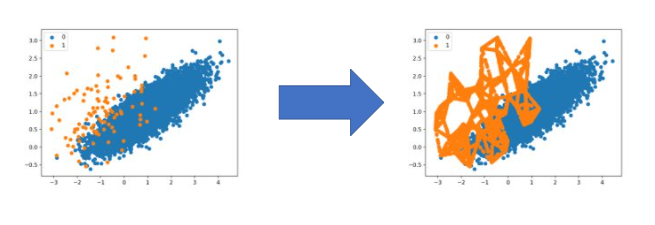
source: machinelearningmastery.com

However, smote only works with continuous data, and in our case we have mixed data, therefore we applyed SMOTE NC which with regards to categorical features, the new sample generated is packed based on the most frequent category of the nearest neighbors present during the generation.

In [214]:
sm = SMOTENC(categorical_features= cat_col_index,random_state=42)

X_sm, y_sm = sm.fit_resample(X_train, Y_train) 

print(f'''Shape of X before SMOTE: {X_train.shape}
Shape of X after SMOTE: {X_sm.shape}''')

print('\nBalance of positive and negative classes (%):')
y_sm.value_counts(normalize=True) * 100

Shape of X before SMOTE: (14112, 32)
Shape of X after SMOTE: (26974, 32)

Balance of positive and negative classes (%):


0    50.0
1    50.0
Name: AFV, dtype: float64

In [217]:
#droping on race dummy variable so it will be reference dummy variable
X_train = X_train.drop('Race White', axis = 1)
X_test = X_test.drop('Race White', axis = 1)
X_sm = X_sm.drop("Race White", axis = 1)


***
$\mathbf{\text{Saving the data to CSV files}}$<br>
***

In [38]:
X_sm.to_csv('X_train_smote.csv', index=False)
y_sm.to_csv('y_train_smote.csv', index=False)
X_train.to_csv('x_no_smote.csv', index=False)
Y_train.to_csv('y_no_smote.csv', index=False)
X_test.to_csv('X_test.csv', index=False) # test data are left as they are without smote
Y_test.to_csv('Y_test.csv', index=False)
result.to_csv('result.csv', index=False)

# <center> **Data Importation**</center>

In [2]:
# In order not to restart the program from beginning each time we can just import the data
X_sm = pd.read_csv('X_train_smote.csv')
y_sm = pd.read_csv('y_train_smote.csv')
X_train = pd.read_csv('x_no_smote.csv')
Y_train = pd.read_csv('y_no_smote.csv')
X_test = pd.read_csv('X_test.csv')
Y_test = pd.read_csv('Y_test.csv')
result = pd.read_csv('result.csv')
x_sm_famd = pd.read_csv('x_famd_train.csv') # traing data after factor analysis done in r
x_test_famd = pd.read_csv('x_famd_test.csv') # test data after factor analysis done in r
prediction_gam = pd.read_csv('prediction_gam.csv') # gam model prediction done in r

# <center> **Data Exploration and visualisation**</center>

***
$\mathbf{\text{DATASET Report}}$<br>
***

In [4]:
profile_afv = pandas_profiling.ProfileReport(result.iloc[:,:],title="AFV Data Exploration Report", 
                                             dark_mode=True)

In [5]:
profile_afv

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# saving the report to html file
profile_afv.to_file(output_file="profile_afv.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

***
$\mathbf{\text{Correlation}}$<br>
***

In [9]:
# Correlation for numerical variable
corrmat = numerical.corr()

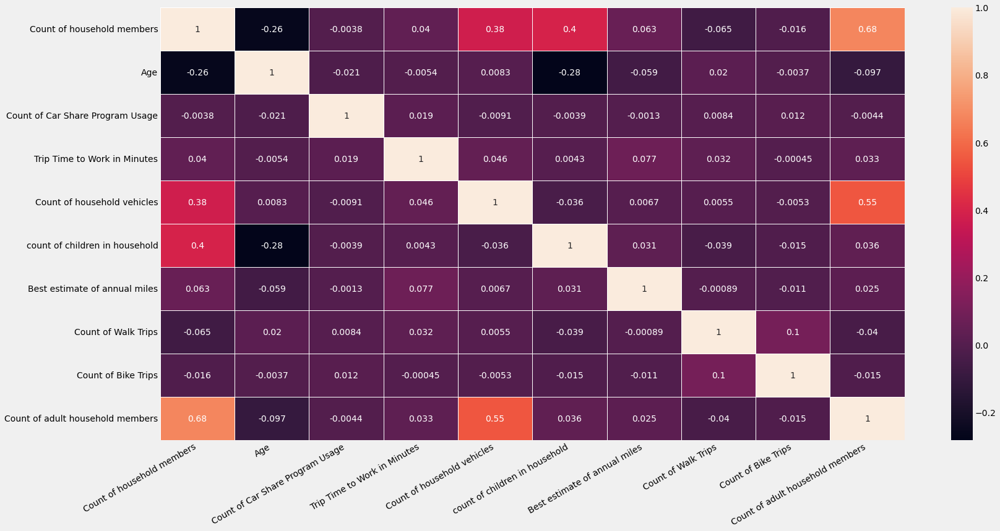

In [10]:
#Pearson Correlation for numerical features
plt.figure(figsize=(24,12))
sns.heatmap(corrmat, vmax=1, annot=True, linewidths=.5)
plt.xticks(rotation=30, horizontalalignment="right")
plt.savefig('correlation.jpeg')
plt.show()

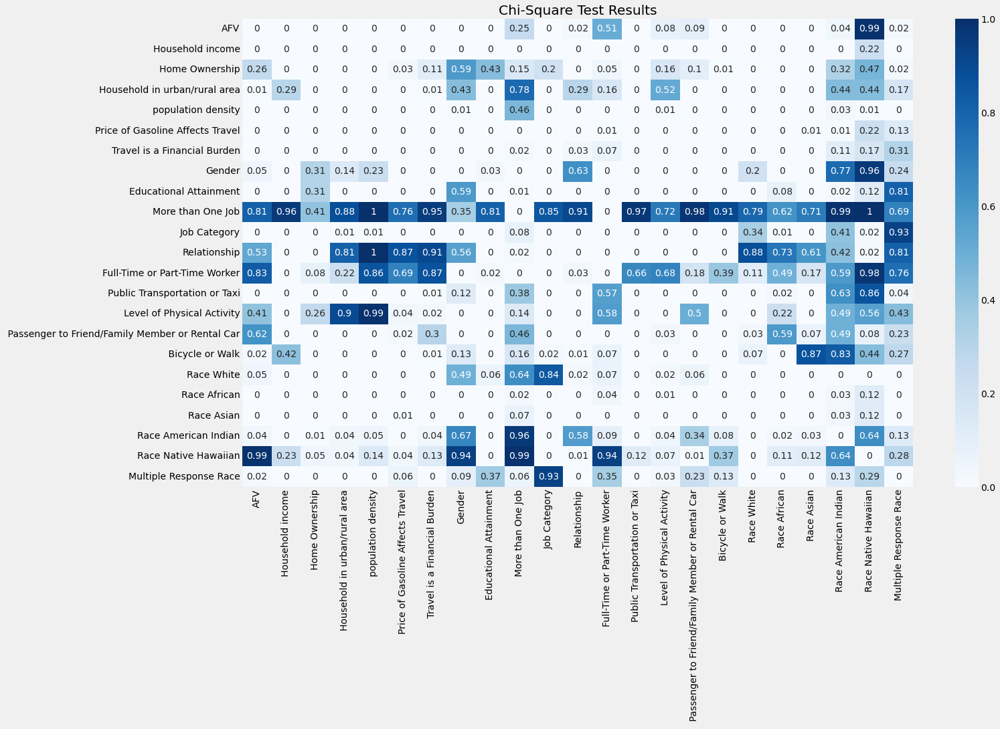

In [11]:
#Correlation between categorical variable
# Resultant Dataframe will be a dataframe where the column names and Index will be the same
# This is a matrix similar to correlation matrix which we get after df.corr()
# Initialize the values in this matrix with 0
resultant = pd.DataFrame(data=[(0 for i in range(len(categorical.columns))) for i in range(len(categorical.columns))], 
                         columns=list(categorical.columns))
resultant.set_index(pd.Index(list(categorical.columns)), inplace = True)

# Finding p_value for all columns and putting them in the resultant matrix
for i in list(categorical.columns):
    for j in list(categorical.columns):
        if i != j:
            chi2_val, p_val = chi2(np.array(categorical[i]).reshape(-1, 1), np.array(categorical[j]).reshape(-1, 1))
            resultant.loc[i,j] = p_val

# Plotting a heatmap
fig = plt.figure(figsize=(20,12))
sns.heatmap(resultant.round(2), annot=True, cmap='Blues')
plt.title('Chi-Square Test Results')
plt.savefig('chi-square.jpeg')
plt.show()

***
$\mathbf{\text{Descriptive Statistics}}$<br>
***

In [12]:
describe = result.describe().round(2).transpose()
describe

,count,mean,std,min,25%,50%,75%,max
AFV,20160.0,0.04,0.20,0.0,0.00,0.00,0.0,1.0
Household income,20160.0,7.58,2.22,1.0,6.00,8.00,9.0,11.0
Home Ownership,20160.0,1.19,0.39,1.0,1.00,1.00,1.0,2.0
Count of household members,20160.0,2.52,1.22,1.0,2.00,2.00,3.0,12.0
Household in urban/rural area,20160.0,1.21,0.41,1.0,1.00,1.00,1.0,2.0
population density,20160.0,4.13,1.88,1.0,2.00,4.00,6.0,8.0
Price of Gasoline Affects Travel,20160.0,2.99,1.29,1.0,2.00,3.00,4.0,5.0
Travel is a Financial Burden,20160.0,3.01,1.04,1.0,2.00,3.00,4.0,5.0
Age,20160.0,47.50,13.30,18.0,37.00,49.00,58.0,92.0
Gender,20160.0,0.53,0.50,0.0,0.00,1.00,1.0,1.0


In [13]:
summary_categorical = rp.summary_cat(categorical)
summary_categorical

,Variable,Outcome,Count,Percent
0,AFV,0,19277,95.62
1,,1,883,4.38
2,Household income,6,3388,16.81
3,,7,3369,16.71
4,,8,3276,16.25
...,...,...,...,...
79,,1,93,0.46
80,Race Native Hawaiian,0,20114,99.77
81,,1,46,0.23
82,Multiple Response Race,0,19668,97.56


In [14]:
summary_categorical.to_latex('summarycategorical.tex', index= False)

In [15]:
summary_numerical = numerical.describe().round(2).transpose()
summary_numerical

,count,mean,std,min,25%,50%,75%,max
Count of household members,20160.0,2.52,1.22,1.0,2.00,2.00,3.0,12.0
Age,20160.0,47.50,13.30,18.0,37.00,49.00,58.0,92.0
Count of Car Share Program Usage,20160.0,0.01,0.17,0.0,0.00,0.00,0.0,8.0
Trip Time to Work in Minutes,20160.0,27.70,27.81,1.0,14.00,20.00,35.0,600.0
Count of household vehicles,20160.0,2.46,1.24,1.0,2.00,2.00,3.0,12.0
count of children in household,20160.0,0.13,0.41,0.0,0.00,0.00,0.0,3.0
Best estimate of annual miles,20160.0,14651.56,15697.54,0.0,7701.14,12082.69,17514.8,200000.0
Count of Walk Trips,20160.0,5.29,7.53,0.0,1.00,3.00,7.0,89.0
Count of Bike Trips,20160.0,0.22,1.10,0.0,0.00,0.00,0.0,70.0
Count of adult household members,20160.0,2.00,0.75,1.0,2.00,2.00,2.0,7.0


In [16]:
summary_numerical[['mean','std','min','max','50%']].to_latex("summarynumerical.tex")

***
$\mathbf{\text{Variance Inflation Factor}}$<br>
***

In [17]:
# VIF dataframe
vif_data = pd.DataFrame()
vif_data["Feature"] = result.drop('Race White',axis = 1).iloc[:,1:].columns
  
# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(result.drop('Race White',axis = 1).iloc[:,1:].values, i)
                          for i in range(len(result.drop('Race White',axis = 1).iloc[:,1:].columns))]
vif_data

,Feature,VIF
0,Household income,19.592299
1,Home Ownership,11.415045
2,Count of household members,13.772372
3,Household in urban/rural area,16.251976
4,population density,10.410594
5,Price of Gasoline Affects Travel,9.937182
6,Travel is a Financial Burden,13.482565
7,Age,16.624895
8,Gender,2.237904
9,Educational Attainment,19.784738


In [18]:
# Saving VIF Table 
vif_data.to_latex("vif.tex")

***
$\mathbf{\text{Amount of AFV vehicles in the dataset}}$<br>
***

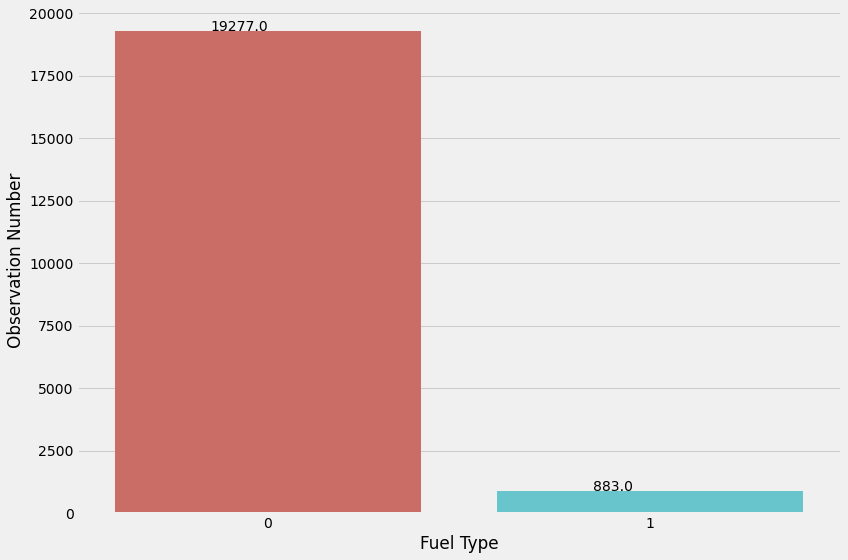

In [19]:
#before SMOTE NC
plt.figure(figsize=(12,8), tight_layout=True)
colors = sns.color_palette('pastel')
ax = sns.countplot(x = 'AFV',data = result,palette = 'hls')
for p in ax.patches:
   ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
plt.xlabel('Fuel Type')
plt.ylabel('Observation Number')
plt.savefig('countplot.jpeg')
plt.show()


# <center> **Machine Learning**</center>

## <center> **Cross Validation Technique**</center>

&emsp;In suppervised learing, the model building procedure can encounter the overfitting problem. In order to avoid it we do cross validation which has multiple techniques. In this research we did Stratified K-Fold cross-validation since it is the best technique to work with unbalanced dataset. It is an enhanced version of k-fold technique but the difference is that in each fold it would have the same ratio of targer variable in each class which make it work well while handeling inbalanced dataset.


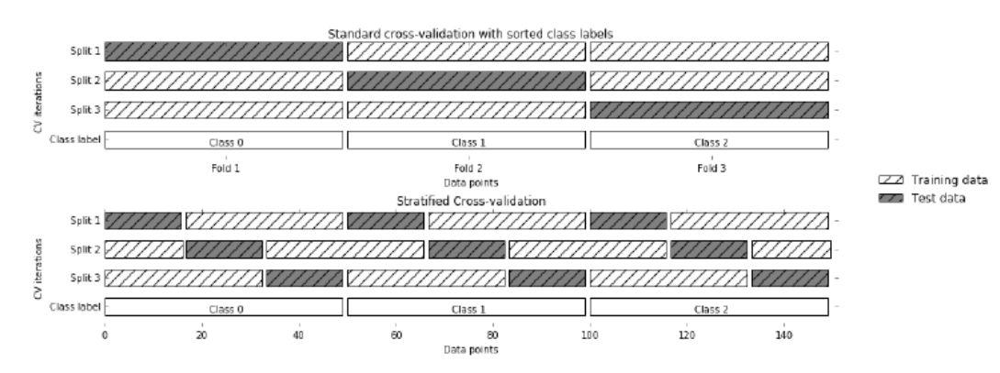
source : analyticsvidhya.com
 

## <center> **Logistic Regression**</center>

### <center> **Before Smote**</center>

In [4]:
Logistic_regression_no_smote = LogisticRegression(max_iter=50000)
Logistic_regression_no_smote.fit(X_train,Y_train.values.ravel())

LogisticRegression(max_iter=50000)

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy = 0.96
Recall =  0.00
F1  = 0.00
Precision = 0.00
AUC = 0.50


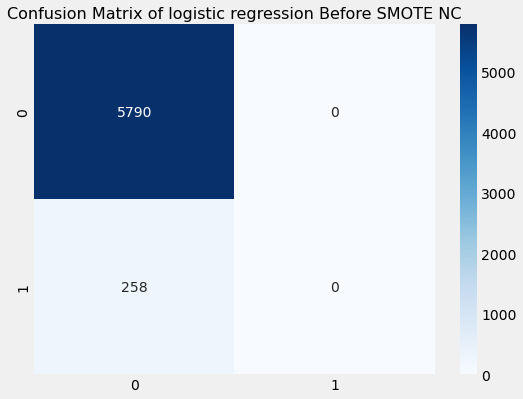

In [5]:
pred_logistic_no_smote = Logistic_regression_no_smote.predict(X_test)
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, pred_logistic_no_smote):.2f}\nRecall =  {recall_score(Y_test,pred_logistic_no_smote):.2f}\nF1  = {f1_score(Y_test,pred_logistic_no_smote):.2f}\nPrecision = {precision_score(Y_test,pred_logistic_no_smote):.2f}\nAUC = {roc_auc_score(Y_test,pred_logistic_no_smote):.2f}')
cm = confusion_matrix(Y_test, pred_logistic_no_smote)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of logistic regression Before SMOTE NC', size=16)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('cm_logistic_nosmote')
plt.show()


We Observe that the model befor smote fails totally to predict any individual having an AFV Vehicle. 

In [6]:
# Define a result table for results before smote
result_before_smote = pd.DataFrame(columns=['Classifiers','Accuracy', 'Recal','F1','Precision','AUC'])

# Define a result table for results after smote
result_after_smote = pd.DataFrame(columns=['Classifiers','Accuracy', 'Recal','F1','Precision','AUC'])

In [7]:
result_before_smote = result_before_smote.append({'Classifiers':"Logistic regression",
                                        'Accuracy':accuracy_score(Y_test, pred_logistic_no_smote), 
                                        'Recal':recall_score(Y_test,pred_logistic_no_smote), 
                                        'F1':f1_score(Y_test,pred_logistic_no_smote),
                                        'Precision':precision_score(Y_test,pred_logistic_no_smote),
                                        "AUC" : roc_auc_score(Y_test,pred_logistic_no_smote)}, ignore_index=True)
result_before_smote

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.957341,0.0,0.0,0.0,0.5


### <center> **After Smote**</center>

Below We Perform Grid Search Cross Validation for Logistic Regression Model

In [8]:
model = LogisticRegression(max_iter = 50000)

c_values = [100, 10, 1.0, 0.1, 0.01]
# define grid search
grid = dict(C=c_values)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='f1',error_score=0)
grid_result = grid_search.fit(X_sm, y_sm.values.ravel())
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.789100 using {'C': 1.0}
0.781610 (0.014849) with: {'C': 100}
0.786951 (0.011180) with: {'C': 10}
0.789100 (0.008725) with: {'C': 1.0}
0.778369 (0.019190) with: {'C': 0.1}
0.771047 (0.023326) with: {'C': 0.01}


In [9]:
Logistic_regression = grid_result.best_estimator_
Logistic_regression.fit(X_sm, y_sm.values.ravel())

LogisticRegression(max_iter=50000)

Accuracy = 0.73
Recall =  0.47
F1  = 0.13
Precision = 0.07
AUC = 0.60


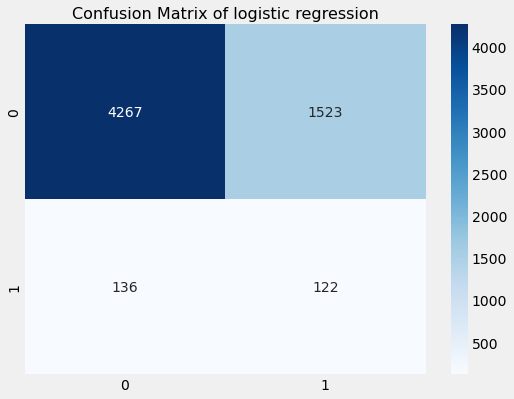

In [10]:
pred_logistic = Logistic_regression.predict(X_test)

# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, pred_logistic):.2f}\nRecall =  {recall_score(Y_test,pred_logistic):.2f}\nF1  = {f1_score(Y_test,pred_logistic):.2f}\nPrecision = {precision_score(Y_test,pred_logistic):.2f}\nAUC = {roc_auc_score(Y_test,pred_logistic):.2f}')
cm = confusion_matrix(Y_test, pred_logistic)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of logistic regression', size=16)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('cm_log_tunning.jpeg')
plt.show()

Below, I'll try to fit the model without the hyper parameters tunning to see the difference

In [11]:
Logistic_regression_base = LogisticRegression(max_iter=50000)
Logistic_regression_base.fit(X_sm, y_sm.values.ravel())

LogisticRegression(max_iter=50000)

Accuracy = 0.73
Recall =  0.47
F1  = 0.13
Precision = 0.07
AUC = 0.60


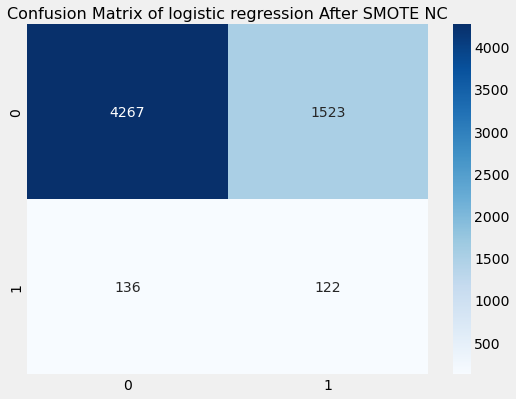

In [12]:
pred_logistic = Logistic_regression_base.predict(X_test)

# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, pred_logistic):.2f}\nRecall =  {recall_score(Y_test,pred_logistic):.2f}\nF1  = {f1_score(Y_test,pred_logistic):.2f}\nPrecision = {precision_score(Y_test,pred_logistic):.2f}\nAUC = {roc_auc_score(Y_test,pred_logistic):.2f}')
cm = confusion_matrix(Y_test, pred_logistic)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of logistic regression After SMOTE NC', size=16)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');

plt.savefig('confusion_matrix_log.jpeg')
plt.show()

We observed that this model without hyper parameters tunning performed slightly better then the model with hyper parameters tunning by having a higher f1 score and recall, therefore, we'll use this model in the report for the logistic regression predictions 

One on the main importance in this research in not only the predictive capability of the models, but also the interpretability of the features. Below you'll find the feature importance plot.

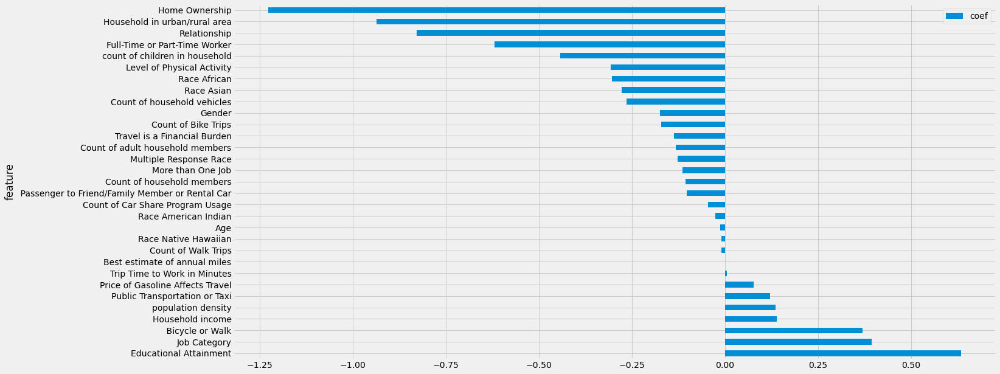

In [13]:
w=Logistic_regression_base.coef_[0]
plt.rcParams["figure.figsize"] = (20,10)

feature_importance = pd.DataFrame(X_sm.columns, columns = ["feature"])
feature_importance["coef"] =  w
feature_importance = feature_importance.sort_values(by = ["coef"], ascending=False)
 

ax = feature_importance.plot.barh(x='feature', y='coef')
plt.savefig('coef_log.jpeg')
plt.show()

In [14]:
result_after_smote = result_after_smote.append({'Classifiers':"Logistic regression ",
                                        'Accuracy':accuracy_score(Y_test, pred_logistic), 
                                        'Recal':recall_score(Y_test,pred_logistic), 
                                        'F1':f1_score(Y_test,pred_logistic),
                                        'Precision':precision_score(Y_test,pred_logistic),
                                        "AUC" : roc_auc_score(Y_test,pred_logistic)}, ignore_index=True)
result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914


### <center> **After Smote With Polynomial Features**</center>

In [15]:
# Setting up the polynomial features
poly = PolynomialFeatures(2 , interaction_only=False)
x_poly_train = poly.fit_transform(X_sm)
x_poly_test = poly.fit_transform(X_test)
print(x_poly_train.shape)
print(x_poly_test.shape)

(26974, 528)
(6048, 528)


In [16]:
Logistic_regression_Poly = LogisticRegression(max_iter=50000)
Logistic_regression_Poly.fit(x_poly_train, y_sm.values.ravel())

LogisticRegression(max_iter=50000)

Accuracy = 0.96
Recall =  0.00
F1  = 0.00
Precision = 0.00
AUC = 0.50


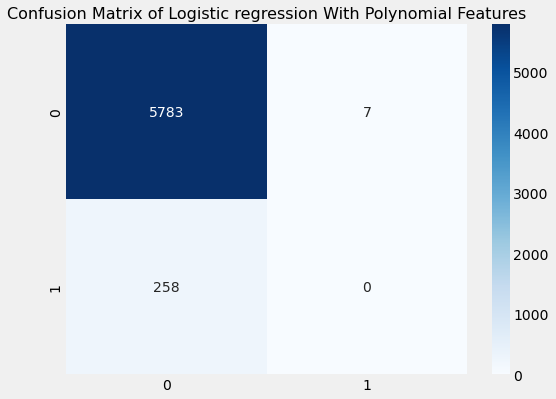

In [17]:
pred_logistic_poly = Logistic_regression_Poly.predict(x_poly_test)

# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, pred_logistic_poly):.2f}\nRecall =  {recall_score(Y_test,pred_logistic_poly):.2f}\nF1  = {f1_score(Y_test,pred_logistic_poly):.2f}\nPrecision = {precision_score(Y_test,pred_logistic_poly):.2f}\nAUC = {roc_auc_score(Y_test,pred_logistic_poly):.2f}')
cm = confusion_matrix(Y_test, pred_logistic_poly)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of Logistic regression With Polynomial Features', size=16)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');

plt.savefig('confusion_matrix_log_poly.jpeg')
plt.show()

We observe that the above model with polynomial features fails to predict any true positive value, now we will try to estimate the model by doing grid search cross validation to see the difference

In [18]:
model = LogisticRegression(max_iter = 50000)

c_values = [100, 10, 1.0, 0.1, 0.01]
# define grid search
grid = dict(C=c_values)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='f1',error_score=0)
grid_result_poly = grid_search.fit(x_poly_train, y_sm.values.ravel())
# summarize results
print("Best: %f using %s" % (grid_result_poly.best_score_, grid_result_poly.best_params_))
means = grid_result_poly.cv_results_['mean_test_score']
stds = grid_result_poly.cv_results_['std_test_score']
params = grid_result_poly.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.140070 using {'C': 100}
0.140070 (0.228975) with: {'C': 100}
0.140070 (0.228975) with: {'C': 10}
0.140070 (0.228975) with: {'C': 1.0}
0.140070 (0.228975) with: {'C': 0.1}
0.140070 (0.228975) with: {'C': 0.01}


Accuracy = 0.96
Recall =  0.00
F1  = 0.00
Precision = 0.00
AUC = 0.50


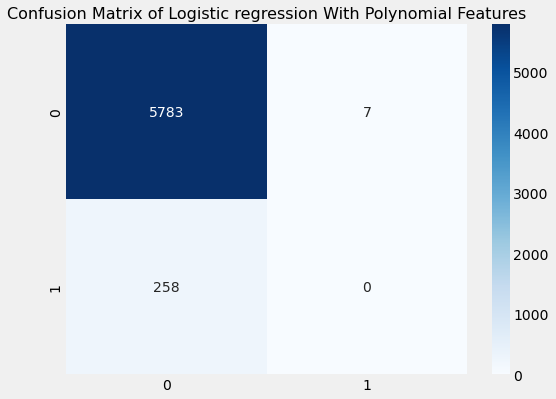

In [19]:
logistic_poly_grid = grid_result_poly.best_estimator_.fit(x_poly_train,y_sm.values.ravel())
pred_logistic_poly_grid = logistic_poly_grid.predict(x_poly_test)

# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, pred_logistic_poly_grid):.2f}\nRecall =  {recall_score(Y_test,pred_logistic_poly_grid):.2f}\nF1  = {f1_score(Y_test,pred_logistic_poly_grid):.2f}\nPrecision = {precision_score(Y_test,pred_logistic_poly_grid):.2f}\nAUC = {roc_auc_score(Y_test,pred_logistic_poly_grid):.2f}')
cm = confusion_matrix(Y_test, pred_logistic_poly_grid)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of Logistic regression With Polynomial Features', size=16)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');

plt.savefig('confusion_matrix_log_poly.jpeg')
plt.show()

In [20]:
result_after_smote = result_after_smote.append({'Classifiers':"Polynomial Logistic Regression",
                                        'Accuracy':accuracy_score(Y_test, pred_logistic_poly_grid), 
                                        'Recal':recall_score(Y_test,pred_logistic_poly_grid), 
                                        'F1':f1_score(Y_test,pred_logistic_poly_grid),
                                        'Precision':precision_score(Y_test,pred_logistic_poly_grid),
                                        "AUC" : roc_auc_score(Y_test,pred_logistic_poly_grid)}, ignore_index=True)
result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914
1,Polynomial Logistic Regression,0.956184,0.000000,0.000000,0.000000,0.499396


## <center> **Logistic Regression with FAMD (Used R language to get the results)**</center>

Since most of our data are discrete variable, the factor analysis using the Principle Component Analysis would be the wrong method to use in order to apply dimensionality reduction. Therefore we will apply FAMD which stands for Factor Analysis of Mixed Data that works on quantitative and qualitative data combined. By summary, it performs PCA on quantitative data and MCA ( multiple correspondence analysis on Qualitative Data. 



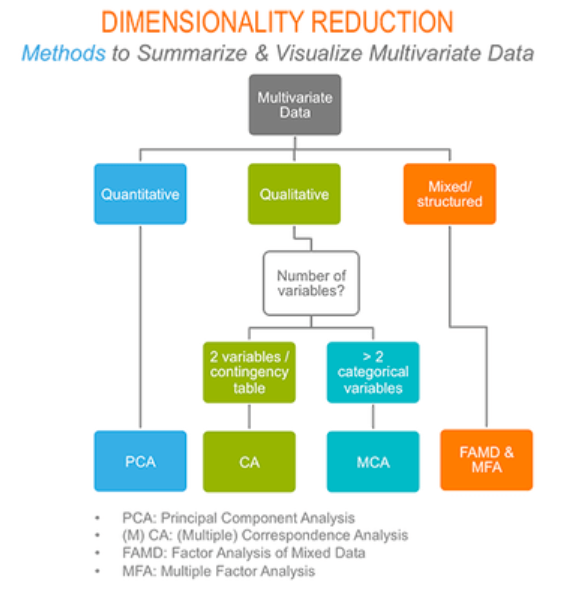
source: nextjournal.com

In python language, to address this problem, 'prince' package exists. However, 'FactoMineR' and 'factoextra' R packages have better functions. Therefore we applied the FAMD in R and then computed the model performance in this jupyter notebook in order to have the same graph types in the report

After Fitting the FAMD in R studio, the results chosen to fit in our model are the dimentions (axes), having an eigenvalue greater the 1, that results to 30 axes.

Below, I'll plot the correlation of the data after applying FAMD.

x_sm_famd : is the train dataset (with smote) after applying FAMD.
x_test_famd : is the test dataset after applying FAMD.

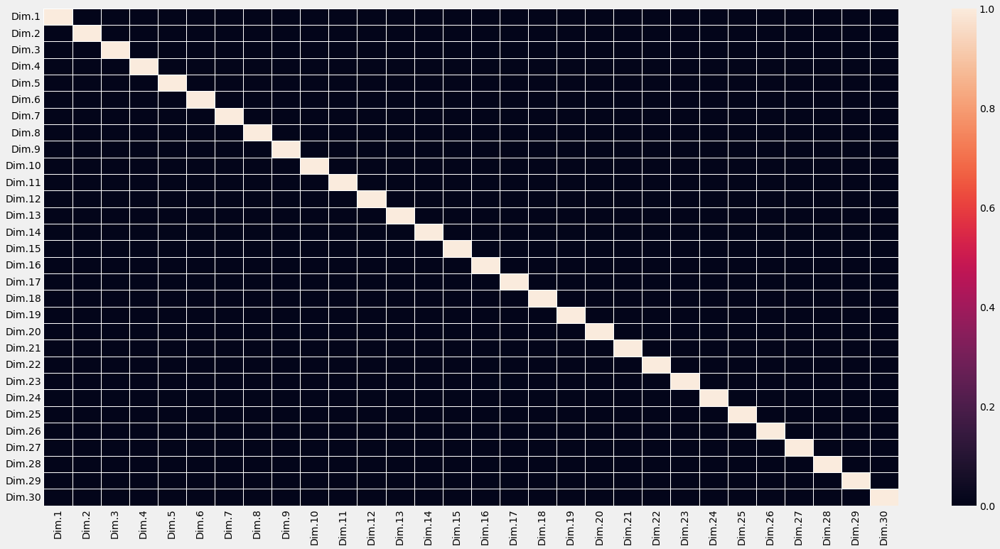

In [21]:
#Pearson Correlation for numerical features
plt.figure(figsize=(24,12))
sns.heatmap(x_sm_famd.iloc[:,: 30 ].corr(), vmax=1, linewidths=.5)
plt.savefig('correlation_famd.jpeg')
plt.show()

Down Below, we'll fit the logistic regression with the data after applying FAMD

In [26]:
logistic_famd = LogisticRegression(max_iter=50000)

In [27]:
logistic_famd.fit( x_sm_famd , y_sm.values.ravel() )

LogisticRegression(max_iter=50000)

Accuracy = 0.53
Recall =  0.67
F1  = 0.11
Precision = 0.06
AUC = 0.60


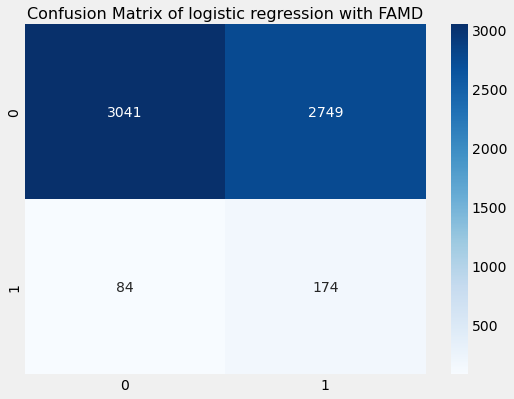

In [28]:
pred_logistic_FAMD = logistic_famd.predict(x_test_famd)

# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, pred_logistic_FAMD):.2f}\nRecall =  {recall_score(Y_test,pred_logistic_FAMD):.2f}\nF1  = {f1_score(Y_test,pred_logistic_FAMD):.2f}\nPrecision = {precision_score(Y_test,pred_logistic_FAMD):.2f}\nAUC = {roc_auc_score(Y_test,pred_logistic_FAMD):.2f}')
cm = confusion_matrix(Y_test, pred_logistic_FAMD)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of logistic regression with FAMD', size=16)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('confusion_matrix_log_FAMD.jpeg')
plt.show()

In [29]:
result_after_smote = result_after_smote.append({'Classifiers':"Logistic regression with FAMD",
                                        'Accuracy':accuracy_score(Y_test, pred_logistic_FAMD), 
                                        'Recal':recall_score(Y_test,pred_logistic_FAMD), 
                                        'F1':f1_score(Y_test,pred_logistic_FAMD),
                                        'Precision':precision_score(Y_test,pred_logistic_FAMD),
                                        "AUC" : roc_auc_score(Y_test,pred_logistic_FAMD)}, ignore_index=True)
result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914
1,Polynomial Logistic Regression,0.956184,0.000000,0.000000,0.000000,0.499396
2,Logistic regression with FAMD,0.531581,0.674419,0.109400,0.059528,0.599817
3,Logistic regression with FAMD,0.531581,0.674419,0.109400,0.059528,0.599817


In [30]:
result_after_smote = result_after_smote.iloc[:-1:]
result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914
1,Polynomial Logistic Regression,0.956184,0.000000,0.000000,0.000000,0.499396
2,Logistic regression with FAMD,0.531581,0.674419,0.109400,0.059528,0.599817


## <center> **Lasso Regression**</center>

  In this section, we will try a different method for hyper parameters tunning by choosing the optimal penalty parameter alpha using the AIC and BIC criteria. 

### <center> **Before Smote**</center>

In [31]:
lasso_lars_ic = make_pipeline(
    StandardScaler(), LassoLarsIC(criterion="aic", normalize=False)
).fit(X_train, Y_train.values.ravel())

In [32]:
results = pd.DataFrame(
    {
        "alphas": lasso_lars_ic[-1].alphas_,
        "AIC criterion": lasso_lars_ic[-1].criterion_,
    }
).set_index("alphas")
alpha_aic = lasso_lars_ic[-1].alpha_

In [33]:
lasso_lars_ic.set_params(lassolarsic__criterion="bic").fit(X_train, Y_train.values.ravel())
results["BIC criterion"] = lasso_lars_ic[-1].criterion_
alpha_bic = lasso_lars_ic[-1].alpha_

In [34]:
#defining a function the highlight the optima result in the table
def highlight_min(x):
    x_min = x.min()
    return ["font-weight: bold" if v == x_min else "" for v in x]



In [35]:
results.style.apply(highlight_min)

,AIC criterion,BIC criterion
alphas,,
0.020694792246342342,-4575.346392,-4575.346392
0.015104921249762713,-4641.521321,-4633.966540
0.014172735570871505,-4656.065996,-4640.956434
0.012227943954227412,-4694.203655,-4671.539312
0.007181837593681641,-4788.260656,-4758.041533
0.006224616370213269,-4800.241680,-4762.467776
0.0049373042942738084,-4817.907780,-4772.579096
0.004671517102925457,-4820.109441,-4767.225975
0.004648892896253276,-4818.529584,-4758.091337


Below I will fit lasso with the alpha 0.0007181217031782476 where we observe the lowest AIC

In [36]:
Lasso_regression_no_smote = Lasso(max_iter = 50000, alpha = 0.0007181217031782476 )

In [37]:
Lasso_regression_no_smote.fit(X_train,Y_train)
y_pred_lasso_no_smote = Lasso_regression_no_smote.predict(X_test)

In [38]:
#transform prediction array to binary classification
y_pred_lasso_no_smote = list(np.where(np.array(y_pred_lasso_no_smote) > 0.5, 1, 0 ))
y_pred_lasso_no_smote[:5]

[0, 0, 0, 0, 0]

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy = 0.96
Recall =  0.00
F1  = 0.00
Precision = 0.00
AUC = 0.50


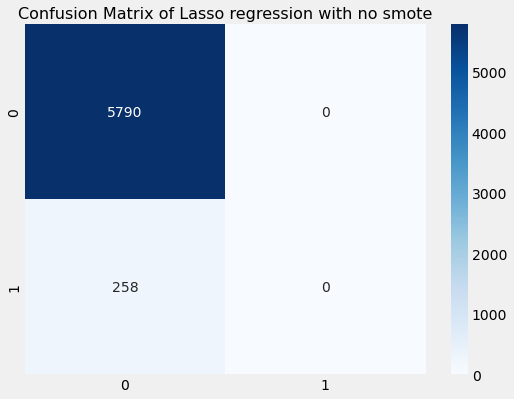

In [39]:
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, y_pred_lasso_no_smote):.2f}\nRecall =  {recall_score(Y_test,y_pred_lasso_no_smote):.2f}\nF1  = {f1_score(Y_test,y_pred_lasso_no_smote):.2f}\nPrecision = {precision_score(Y_test,y_pred_lasso_no_smote):.2f}\nAUC = {roc_auc_score(Y_test,y_pred_lasso_no_smote):.2f}')
cm = confusion_matrix(Y_test, y_pred_lasso_no_smote)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of Lasso regression with no smote', size=16)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('confusion_matrix_lasso_no_sm.jpeg')
plt.show()

Similarly to the previous results, lasso model with hyper parameters tunning fails to predict a single case of True positive

In [40]:
result_before_smote = result_before_smote.append({'Classifiers':"Lasso regression ",
                                        'Accuracy':accuracy_score(Y_test, y_pred_lasso_no_smote), 
                                        'Recal':recall_score(Y_test,y_pred_lasso_no_smote), 
                                        'F1':f1_score(Y_test,y_pred_lasso_no_smote),
                                        'Precision':precision_score(Y_test,y_pred_lasso_no_smote),
                                        "AUC" : roc_auc_score(Y_test,y_pred_lasso_no_smote)}, ignore_index=True)
result_before_smote

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.957341,0.0,0.0,0.0,0.5
1,Lasso regression,0.957341,0.0,0.0,0.0,0.5


### <center> **After Smote**</center>


#### <center> **Selecting Lasso via an information criterion**</center>

In [41]:
start_time = time.time()
lasso_lars_ic = make_pipeline(
    StandardScaler(), LassoLarsIC(criterion="aic", normalize=False)
).fit(X_sm, y_sm)
fit_time = time.time() - start_time

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [42]:
fit_time

0.07080984115600586

In [43]:
results = pd.DataFrame(
    {
        "alphas": lasso_lars_ic[-1].alphas_,
        "AIC criterion": lasso_lars_ic[-1].criterion_,
    }
).set_index("alphas")
alpha_aic = lasso_lars_ic[-1].alpha_

In [44]:
lasso_lars_ic.set_params(lassolarsic__criterion="bic").fit(X_sm, y_sm)
results["BIC criterion"] = lasso_lars_ic[-1].criterion_
alpha_bic = lasso_lars_ic[-1].alpha_

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [45]:

results.style.apply(highlight_min)

,AIC criterion,BIC criterion
alphas,,
0.2054827018576358,43227.467085,43227.467085
0.14084759603775193,39233.558251,39241.760880
0.1356847002341209,38877.021968,38893.427226
0.11087999638951253,36658.012747,36682.620633
0.08497035981508362,34065.649229,34098.459744
0.07491267168937939,33212.726235,33253.739379
0.07304324724164363,33023.602119,33072.817891
0.07139153087664533,32847.400389,32904.818790
0.07136164462469445,32845.753665,32911.374695


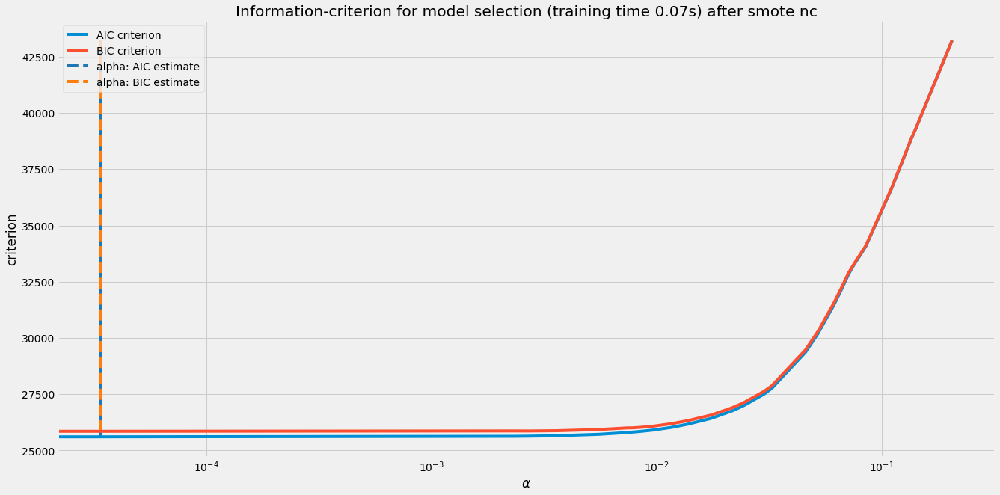

In [46]:
ax = results.plot()
ax.vlines(
    alpha_aic,
    results["AIC criterion"].min(),
    results["AIC criterion"].max(),
    label="alpha: AIC estimate",
    linestyles="--",
    color="tab:blue",
)
ax.vlines(
    alpha_bic,
    results["BIC criterion"].min(),
    results["BIC criterion"].max(),
    label="alpha: BIC estimate",
    linestyle="--",
    color="tab:orange",
)
ax.set_xlabel(r"$\alpha$")
ax.set_ylabel("criterion")
ax.set_xscale("log")
ax.figure
ax.legend()
_ = ax.set_title(
    f"Information-criterion for model selection (training time {fit_time:.2f}s) after smote nc"
) 
fig = ax.get_figure()
fig.savefig('aic.jpeg')

#### <center> **Fitting lasso with optimal alpha parameter**</center>

In [47]:
print('The optimal alpha is ', str(results[results['AIC criterion'] == results['AIC criterion'].min()].index))

The optimal alpha is  Float64Index([3.3653807015778935e-05], dtype='float64', name='alphas')


In [48]:
Lasso_regression = Lasso(max_iter = 50000, 
                         alpha = results[results['AIC criterion'] == results['AIC criterion'].min()].index)

In [49]:
Lasso_regression.fit(X_sm,y_sm)
y_pred_lasso = Lasso_regression.predict(X_test)

In [50]:
y_pred_lasso

array([0.55850404, 0.55112713, 0.5626771 , ..., 0.65326457, 0.2738704 ,
       0.24558156])

In [51]:
#transform prediction array to binary classification
pred_y_lasso = list(np.where(np.array(y_pred_lasso) > 0.5, 1, 0 ))
pred_y_lasso[:5]

[1, 1, 1, 1, 1]

Accuracy = 0.72
Recall =  0.45
F1  = 0.12
Precision = 0.07
AUC = 0.59


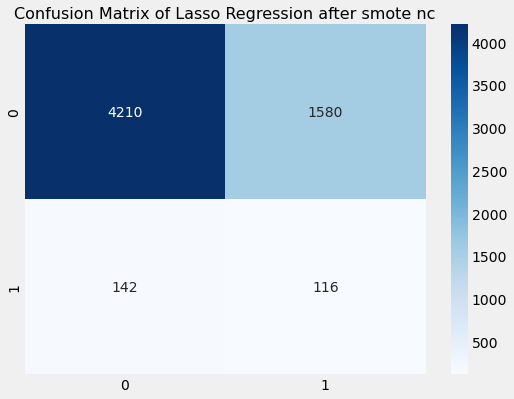

In [52]:
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, pred_y_lasso):.2f}\nRecall =  {recall_score(Y_test,pred_y_lasso):.2f}\nF1  = {f1_score(Y_test,pred_y_lasso):.2f}\nPrecision = {precision_score(Y_test,pred_y_lasso):.2f}\nAUC = {roc_auc_score(Y_test,pred_y_lasso):.2f}')
cm = confusion_matrix(Y_test,pred_y_lasso)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of Lasso Regression after smote nc', size=16)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('confusion_matrix_lasso.jpeg')
plt.show()

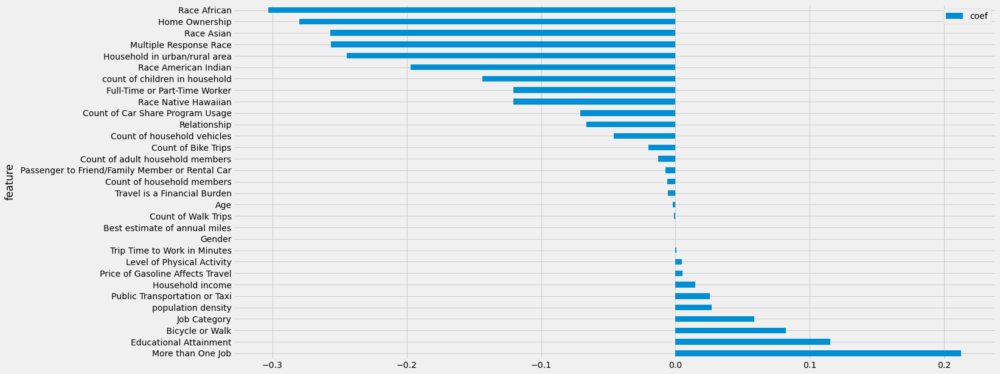

In [53]:
#Feature Impotance
w= Lasso_regression.coef_
plt.rcParams["figure.figsize"] = (20,10)

feature_importance = pd.DataFrame(X_sm.columns, columns = ["feature"])
feature_importance["coef"] =  w
feature_importance = feature_importance.sort_values(by = ["coef"], ascending=False)
 

ax = feature_importance.plot.barh(x='feature', y='coef')
plt.savefig('coef_lr.jpeg')
plt.show()

In [54]:
result_after_smote = result_after_smote.append({'Classifiers':"Lasso regression ",
                                        'Accuracy':accuracy_score(Y_test, pred_y_lasso), 
                                        'Recal':recall_score(Y_test,pred_y_lasso), 
                                        'F1':f1_score(Y_test,pred_y_lasso),
                                        'Precision':precision_score(Y_test,pred_y_lasso),
                                        "AUC" : roc_auc_score(Y_test,pred_y_lasso)}, ignore_index=True)
result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914
1,Polynomial Logistic Regression,0.956184,0.000000,0.000000,0.000000,0.499396
2,Logistic regression with FAMD,0.531581,0.674419,0.109400,0.059528,0.599817
3,Lasso regression,0.715278,0.449612,0.118731,0.068396,0.588364


### <center> **After Smote with Polynomial Features**</center>

In [55]:
start_time = time.time()
lasso_lars_ic = make_pipeline(
    StandardScaler(), LassoLarsIC(criterion="aic", normalize=False)
).fit(x_poly_train, y_sm)
fit_time = time.time() - start_time

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [56]:
results = pd.DataFrame(
    {
        "alphas": lasso_lars_ic[-1].alphas_,
        "AIC criterion": lasso_lars_ic[-1].criterion_,
    }
).set_index("alphas")
alpha_aic = lasso_lars_ic[-1].alpha_

In [57]:
lasso_lars_ic.set_params(lassolarsic__criterion="bic").fit(x_poly_train, y_sm)
results["BIC criterion"] = lasso_lars_ic[-1].criterion_
alpha_bic = lasso_lars_ic[-1].alpha_

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [58]:
results.style.apply(highlight_min)

,AIC criterion,BIC criterion
alphas,,
0.220906101186657,48429.216737,48429.216737
0.21807839570380325,48153.620089,48161.822718
0.17524715958890702,43830.682373,43847.087631
0.1583809254647368,41642.523338,41667.131225
0.13565010713856024,38851.197137,38884.007652
0.13071628943867794,38281.415929,38322.429073
0.12611769692737035,37737.953981,37778.967125
0.10816014070451424,35823.185905,35864.199049
0.08884272795805244,33980.951934,34030.167707


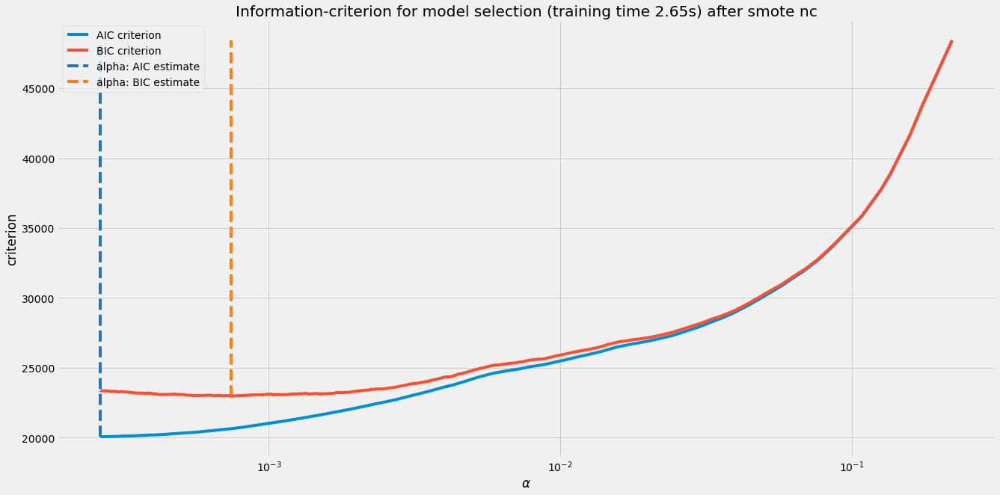

In [59]:
ax = results.plot()
ax.vlines(
    alpha_aic,
    results["AIC criterion"].min(),
    results["AIC criterion"].max(),
    label="alpha: AIC estimate",
    linestyles="--",
    color="tab:blue",
)
ax.vlines(
    alpha_bic,
    results["BIC criterion"].min(),
    results["BIC criterion"].max(),
    label="alpha: BIC estimate",
    linestyle="--",
    color="tab:orange",
)
ax.set_xlabel(r"$\alpha$")
ax.set_ylabel("criterion")
ax.set_xscale("log")
ax.figure
ax.legend()
_ = ax.set_title(
    f"Information-criterion for model selection (training time {fit_time:.2f}s) after smote nc"
) 
fig = ax.get_figure()
fig.savefig('aic_poly.jpeg')

In [60]:
print("The optimal alpha is ", 
      str(results[results['AIC criterion'] == results['BIC criterion'].min()].index))

The optimal alpha is  Float64Index([], dtype='float64', name='alphas')


In [61]:
Lasso_regression_poly = Lasso(max_iter = 50000,
                              alpha = results[results['BIC criterion'] == results['BIC criterion'].min()].index)

In [62]:
Lasso_regression_poly.fit(x_poly_train,y_sm)
y_pred_lasso_poly_p = Lasso_regression_poly.predict(x_poly_test)

In [63]:
#transform prediction array to binary classification
y_pred_lasso_poly = list(np.where(np.array(y_pred_lasso_poly_p) > 0.5, 1, 0 ))


Accuracy = 0.78
Recall =  0.36
F1  = 0.12
Precision = 0.07
AUC = 0.58


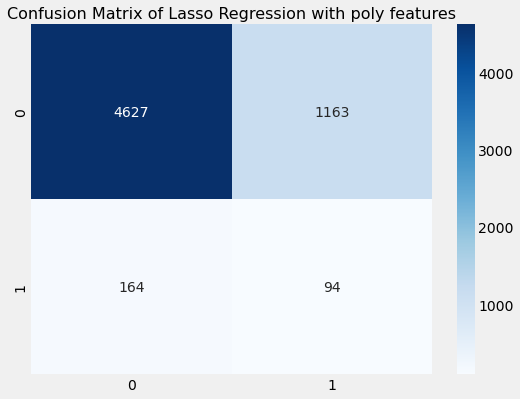

In [64]:
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, y_pred_lasso_poly):.2f}\nRecall =  {recall_score(Y_test,y_pred_lasso_poly):.2f}\nF1  = {f1_score(Y_test,y_pred_lasso_poly):.2f}\nPrecision = {precision_score(Y_test,y_pred_lasso_poly):.2f}\nAUC = {roc_auc_score(Y_test,y_pred_lasso_poly):.2f}')
cm = confusion_matrix(Y_test,y_pred_lasso_poly)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of Lasso Regression with poly features', size=16)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('confusion_matrix_lasso_poly.jpeg')
plt.show()

In [65]:
result_after_smote = result_after_smote.append({'Classifiers':"Polynomial Lasso Regression",
                                        'Accuracy':accuracy_score(Y_test, y_pred_lasso_poly), 
                                        'Recal':recall_score(Y_test,y_pred_lasso_poly), 
                                        'F1':f1_score(Y_test,y_pred_lasso_poly),
                                        'Precision':precision_score(Y_test,y_pred_lasso_poly),
                                        "AUC" : roc_auc_score(Y_test,y_pred_lasso_poly)}, ignore_index=True)
result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914
1,Polynomial Logistic Regression,0.956184,0.000000,0.000000,0.000000,0.499396
2,Logistic regression with FAMD,0.531581,0.674419,0.109400,0.059528,0.599817
3,Lasso regression,0.715278,0.449612,0.118731,0.068396,0.588364
4,Polynomial Lasso Regression,0.780589,0.364341,0.124092,0.074781,0.581739


## <center> **Ridge Regression**</center>

### <center> **Befor Smote**</center>

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:1059: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Best: 0.000000 using {'alpha': 1e-05}
Accuracy = 0.96
Recall =  0.00
F1  = 0.00
Precision = 0.00
AUC = 0.50


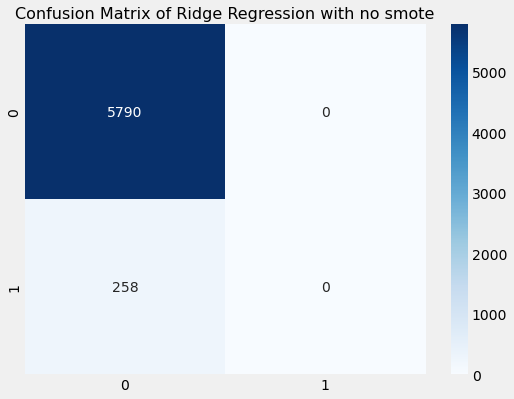

In [66]:
range_1 = np.arange(0.00001, 5, 0.05)
alpha_ridge = list(range_1)
# define models and parameters
model = RidgeClassifier()
alpha = alpha_ridge
# define grid search
grid = dict(alpha=alpha)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='f1',error_score=0)
grid_result = grid_search.fit(X_train,Y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']

ridge_classifier_no_sm = grid_result.best_estimator_
y_pred_ridge_no_sm = ridge_classifier_no_sm.predict(X_test)

# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, y_pred_ridge_no_sm):.2f}\nRecall =  {recall_score(Y_test,y_pred_ridge_no_sm):.2f}\nF1  = {f1_score(Y_test,y_pred_ridge_no_sm):.2f}\nPrecision = {precision_score(Y_test,y_pred_ridge_no_sm):.2f}\nAUC = {roc_auc_score(Y_test,y_pred_ridge_no_sm):.2f}')
cm = confusion_matrix(Y_test,y_pred_ridge_no_sm)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of Ridge Regression with no smote', size=16)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('confusion_matrix_ridge_no_sm.jpeg')
plt.show()

Moreover, Even after the hyper parameter tunning, we also observe that ridge regression fail to predict any true positive value when smote is not applied

In [67]:
result_before_smote = result_before_smote.append({'Classifiers':"Ridge regression",
                                        'Accuracy':accuracy_score(Y_test, y_pred_ridge_no_sm), 
                                        'Recal':recall_score(Y_test,y_pred_ridge_no_sm), 
                                        'F1':f1_score(Y_test,y_pred_ridge_no_sm),
                                        'Precision':precision_score(Y_test,y_pred_ridge_no_sm),
                                        "AUC" : roc_auc_score(Y_test,y_pred_ridge_no_sm)}, ignore_index=True)
result_before_smote

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.957341,0.0,0.0,0.0,0.5
1,Lasso regression,0.957341,0.0,0.0,0.0,0.5
2,Ridge regression,0.957341,0.0,0.0,0.0,0.5


### <center> **After Smote**</center>

In [68]:
range_1 = np.arange(0.00001, 5, 0.05)
alpha_ridge = list(range_1)


In [69]:
# define models and parameters
model = RidgeClassifier()
alpha = alpha_ridge
# define grid search
grid = dict(alpha=alpha)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='f1',error_score=0)
grid_result_ridge_sm = grid_search.fit(X_sm,y_sm)
# summarize results
print("Best: %f using %s" % (grid_result_ridge_sm.best_score_, grid_result_ridge_sm.best_params_))
means = grid_result_ridge_sm.cv_results_['mean_test_score']
stds = grid_result_ridge_sm.cv_results_['std_test_score']
params = grid_result_ridge_sm.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.815106 using {'alpha': 1e-05}
0.815106 (0.005744) with: {'alpha': 1e-05}
0.815106 (0.005744) with: {'alpha': 0.050010000000000006}
0.815106 (0.005744) with: {'alpha': 0.10001}
0.815093 (0.005735) with: {'alpha': 0.15001000000000003}
0.815093 (0.005735) with: {'alpha': 0.20001000000000002}
0.815093 (0.005735) with: {'alpha': 0.25001}
0.815093 (0.005735) with: {'alpha': 0.30001000000000005}
0.815093 (0.005735) with: {'alpha': 0.35001000000000004}
0.815093 (0.005735) with: {'alpha': 0.40001000000000003}
0.815070 (0.005760) with: {'alpha': 0.45001}
0.815070 (0.005760) with: {'alpha': 0.50001}
0.815070 (0.005775) with: {'alpha': 0.55001}
0.815070 (0.005775) with: {'alpha': 0.60001}
0.815070 (0.005775) with: {'alpha': 0.65001}
0.815070 (0.005775) with: {'alpha': 0.70001}
0.815070 (0.005775) with: {'alpha': 0.75001}
0.815070 (0.005775) with: {'alpha': 0.80001}
0.815070 (0.005775) with: {'alpha': 0.85001}
0.815070 (0.005775) with: {'alpha': 0.90001}
0.815070 (0.005775) with: {'alpha': 

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:1059: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [70]:
grid_result_ridge_sm.best_params_

{'alpha': 1e-05}

#### <center> **Fitting ridge with optimal alpha parameter**</center>

In [71]:
ridge_regression = grid_result_ridge_sm.best_estimator_

In [72]:
ridge_regression.fit(X_sm,y_sm)

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:1059: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


RidgeClassifier(alpha=1e-05)

In [73]:
y_pred_ridge_sm = ridge_regression.predict(X_test)

In [74]:
y_pred_ridge_sm

array([1, 1, 1, ..., 1, 0, 0], dtype=int64)

Accuracy = 0.72
Recall =  0.45
F1  = 0.12
Precision = 0.07
AUC = 0.59


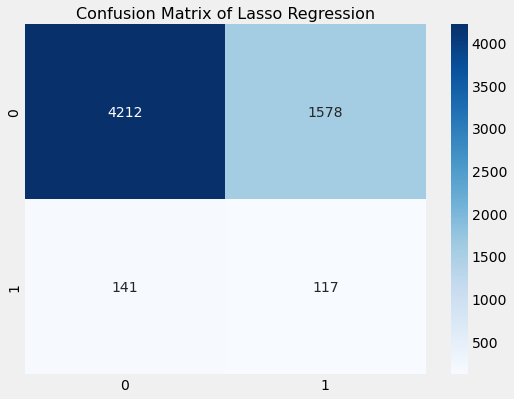

In [75]:
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, y_pred_ridge_sm):.2f}\nRecall =  {recall_score(Y_test,y_pred_ridge_sm):.2f}\nF1  = {f1_score(Y_test,y_pred_ridge_sm):.2f}\nPrecision = {precision_score(Y_test,y_pred_ridge_sm):.2f}\nAUC = {roc_auc_score(Y_test,y_pred_ridge_sm):.2f}')
cm = confusion_matrix(Y_test,y_pred_ridge_sm)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of Ridge Regression', size=16)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('confusion_matrix_ridge.jpeg')
plt.show()

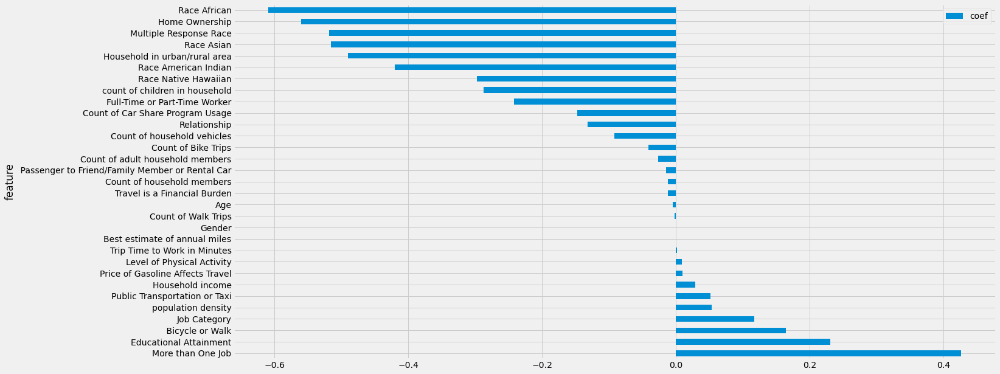

In [76]:
w=ridge_regression.coef_[0]
plt.rcParams["figure.figsize"] = (20,10)

feature_importance = pd.DataFrame(X_sm.columns, columns = ["feature"])
feature_importance["coef"] =  w
feature_importance = feature_importance.sort_values(by = ["coef"], ascending=False)
 

ax = feature_importance.plot.barh(x='feature', y='coef')
plt.savefig('coef_ridge.jpeg')
plt.show()

In [77]:
result_after_smote = result_after_smote.append({'Classifiers':"Ridge regression ",
                                        'Accuracy':accuracy_score(Y_test, y_pred_ridge_sm), 
                                        'Recal':recall_score(Y_test,y_pred_ridge_sm), 
                                        'F1':f1_score(Y_test,y_pred_ridge_sm),
                                        'Precision':precision_score(Y_test,y_pred_ridge_sm),
                                        "AUC" : roc_auc_score(Y_test,y_pred_ridge_sm)}, ignore_index=True)
result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914
1,Polynomial Logistic Regression,0.956184,0.000000,0.000000,0.000000,0.499396
2,Logistic regression with FAMD,0.531581,0.674419,0.109400,0.059528,0.599817
3,Lasso regression,0.715278,0.449612,0.118731,0.068396,0.588364
4,Polynomial Lasso Regression,0.780589,0.364341,0.124092,0.074781,0.581739
5,Ridge regression,0.715774,0.453488,0.119816,0.069027,0.590475


### <center> **After Smote with poly features**</center>

In [78]:
# define models and parameters
model = RidgeClassifier()
alpha = alpha_ridge
# define grid search
grid = dict(alpha=alpha)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='f1',error_score=0)
grid_result_ridge_sm_poly = grid_search.fit(x_poly_train,y_sm)
# summarize results
print("Best: %f using %s" % (grid_result_ridge_sm_poly.best_score_, grid_result_ridge_sm_poly.best_params_))
means = grid_result_ridge_sm_poly.cv_results_['mean_test_score']
stds = grid_result_ridge_sm_poly.cv_results_['std_test_score']
params = grid_result_ridge_sm_poly.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:1059: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Best: 0.854231 using {'alpha': 3.3000100000000003}
0.853548 (0.004505) with: {'alpha': 1e-05}
0.853634 (0.004459) with: {'alpha': 0.050010000000000006}
0.853654 (0.004433) with: {'alpha': 0.10001}
0.853598 (0.004450) with: {'alpha': 0.15001000000000003}
0.853547 (0.004459) with: {'alpha': 0.20001000000000002}
0.853563 (0.004429) with: {'alpha': 0.25001}
0.853573 (0.004457) with: {'alpha': 0.30001000000000005}
0.853608 (0.004468) with: {'alpha': 0.35001000000000004}
0.853644 (0.004431) with: {'alpha': 0.40001000000000003}
0.853694 (0.004421) with: {'alpha': 0.45001}
0.853705 (0.004409) with: {'alpha': 0.50001}
0.853735 (0.004407) with: {'alpha': 0.55001}
0.853781 (0.004447) with: {'alpha': 0.60001}
0.853811 (0.004444) with: {'alpha': 0.65001}
0.853892 (0.004397) with: {'alpha': 0.70001}
0.853917 (0.004414) with: {'alpha': 0.75001}
0.853916 (0.004475) with: {'alpha': 0.80001}
0.853911 (0.004439) with: {'alpha': 0.85001}
0.853931 (0.004430) with: {'alpha': 0.90001}
0.853977 (0.004410) wit

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=2.14585e-23): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T


In [79]:
ridge_regression_poly = grid_result_ridge_sm_poly.best_estimator_

In [80]:
ridge_regression_poly.fit(x_poly_train,y_sm)
y_pred_ridge_poly = ridge_regression_poly.predict(x_poly_test)

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:1059: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=2.14585e-23): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T


Accuracy = 0.79
Recall =  0.37
F1  = 0.13
Precision = 0.08
AUC = 0.59


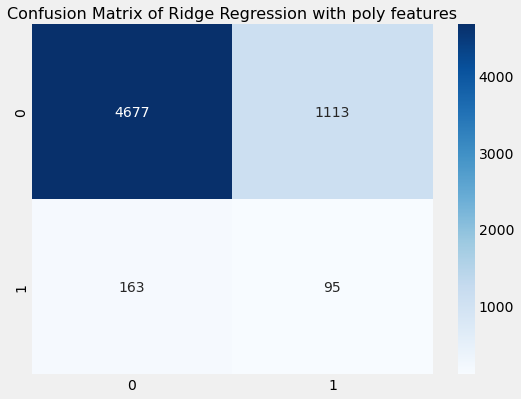

In [81]:
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, y_pred_ridge_poly):.2f}\nRecall =  {recall_score(Y_test,y_pred_ridge_poly):.2f}\nF1  = {f1_score(Y_test,y_pred_ridge_poly):.2f}\nPrecision = {precision_score(Y_test,y_pred_ridge_poly):.2f}\nAUC = {roc_auc_score(Y_test,y_pred_ridge_poly):.2f}')
cm = confusion_matrix(Y_test,y_pred_ridge_poly)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of Ridge Regression with poly features', size=16)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('confusion_matrix_ridge_poly.jpeg')
plt.show()

In [82]:
result_after_smote = result_after_smote.append({'Classifiers':"Polynomial Ridge Regression",
                                        'Accuracy':accuracy_score(Y_test, y_pred_ridge_poly), 
                                        'Recal':recall_score(Y_test,y_pred_ridge_poly), 
                                        'F1':f1_score(Y_test,y_pred_ridge_poly),
                                        'Precision':precision_score(Y_test,y_pred_ridge_poly),
                                        "AUC" : roc_auc_score(Y_test,y_pred_ridge_poly)}, ignore_index=True)
result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914
1,Polynomial Logistic Regression,0.956184,0.000000,0.000000,0.000000,0.499396
2,Logistic regression with FAMD,0.531581,0.674419,0.109400,0.059528,0.599817
3,Lasso regression,0.715278,0.449612,0.118731,0.068396,0.588364
4,Polynomial Lasso Regression,0.780589,0.364341,0.124092,0.074781,0.581739
5,Ridge regression,0.715774,0.453488,0.119816,0.069027,0.590475
6,Polynomial Ridge Regression,0.789021,0.368217,0.129604,0.078642,0.587995


## <center> **Logistic GAM (Was worked with R studio also)**

The GAM model fitting was worked in R studio, however we imported the prediction results in order to evaluate the model in this jupyter file and have the same graphs for all the model.

Bellow you see the prediction for the gam model

In [83]:
prediction_gam

,prediction_gam
0,0.355120
1,0.533292
2,0.432169
3,0.400622
4,0.572369
...,...
6043,0.738840
6044,0.259522
6045,0.182857
6046,0.006821


In [84]:
range_gam =  np.arange(0.01,0.99,0.01)
result_gam = pd.DataFrame(columns=['AUC','Throshold'])
for i in range_gam:
    prediction_gam_binary = list(np.where(np.array(prediction_gam) > i, 1, 0 ))
    result_gam = result_gam.append({'AUC':roc_auc_score(Y_test,prediction_gam_binary),
                                        'Throshold':i, 
                                        }, ignore_index=True)
    
print(result_gam[result_gam['AUC'] == result_gam['AUC'].max()])

         AUC  Throshold
27  0.607117       0.28


We observe we have max AUC with threshold 0.28

Accuracy = 0.67
Recall =  0.54
F1  = 0.12
Precision = 0.07
AUC = 0.61


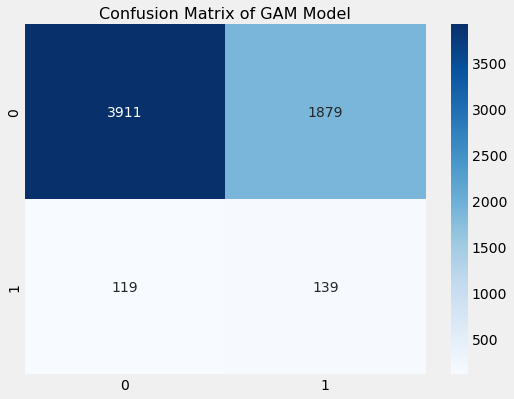

In [85]:
prediction_gam_binary = list(np.where(np.array(prediction_gam) > 0.28, 1, 0 ))
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, prediction_gam_binary):.2f}\nRecall =  {recall_score(Y_test,prediction_gam_binary):.2f}\nF1  = {f1_score(Y_test,prediction_gam_binary):.2f}\nPrecision = {precision_score(Y_test,prediction_gam_binary):.2f}\nAUC = {roc_auc_score(Y_test,prediction_gam_binary):.2f}')
cm = confusion_matrix(Y_test,prediction_gam_binary)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of GAM Model', size=16)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('confusion_matrix_gam.jpeg')
plt.show()

In [86]:
result_after_smote = result_after_smote.append({'Classifiers':"GAM Model",
                                        'Accuracy':accuracy_score(Y_test, prediction_gam_binary), 
                                        'Recal':recall_score(Y_test,prediction_gam_binary), 
                                        'F1':f1_score(Y_test,prediction_gam_binary),
                                        'Precision':precision_score(Y_test,prediction_gam_binary),
                                        "AUC" : roc_auc_score(Y_test,prediction_gam_binary)}, ignore_index=True)
result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914
1,Polynomial Logistic Regression,0.956184,0.000000,0.000000,0.000000,0.499396
2,Logistic regression with FAMD,0.531581,0.674419,0.109400,0.059528,0.599817
3,Lasso regression,0.715278,0.449612,0.118731,0.068396,0.588364
4,Polynomial Lasso Regression,0.780589,0.364341,0.124092,0.074781,0.581739
5,Ridge regression,0.715774,0.453488,0.119816,0.069027,0.590475
6,Polynomial Ridge Regression,0.789021,0.368217,0.129604,0.078642,0.587995
7,GAM Model,0.669643,0.538760,0.122144,0.068880,0.607117


## <center> **Naive Bayes**</center>

### <center> **Before Smote**</center>


In [87]:
# Hyperparameter tunning
param_grid_nb = {
    'var_smoothing': np.logspace(0,-9, num=100)
}
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

nbModel_grid = GridSearchCV(estimator=GaussianNB(), 
                            param_grid=param_grid_nb, verbose=1, scoring='f1',cv=cv, n_jobs=-1)

nbModel_grid.fit(X_train, Y_train.values.ravel())
print(nbModel_grid.best_params_)

Fitting 30 folds for each of 100 candidates, totalling 3000 fits
{'var_smoothing': 1e-09}


Accuracy = 0.95
Recall =  0.00
F1  = 0.00
Precision = 0.00
AUC = 0.50


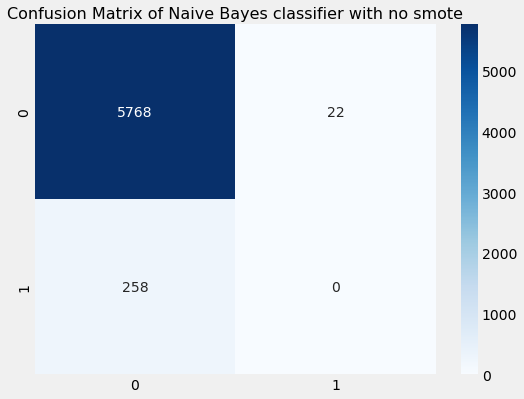

In [88]:
nb_classifier_no_sm = nbModel_grid.best_estimator_
y_pred_nb_no_sm = nb_classifier_no_sm.predict(X_test)

# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, y_pred_nb_no_sm):.2f}\nRecall =  {recall_score(Y_test,y_pred_nb_no_sm):.2f}\nF1  = {f1_score(Y_test,y_pred_nb_no_sm):.2f}\nPrecision = {precision_score(Y_test,y_pred_nb_no_sm):.2f}\nAUC = {roc_auc_score(Y_test,y_pred_nb_no_sm):.2f}')
cm = confusion_matrix(Y_test,y_pred_nb_no_sm)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of Naive Bayes classifier with no smote', size=16)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('confusion_matrix_nb_no_sm.jpeg')
plt.show()

In [89]:
result_before_smote = result_before_smote.append({'Classifiers':"Naive Bayes",
                                        'Accuracy':accuracy_score(Y_test, y_pred_nb_no_sm), 
                                        'Recal':recall_score(Y_test,y_pred_nb_no_sm), 
                                        'F1':f1_score(Y_test,y_pred_nb_no_sm),
                                        'Precision':precision_score(Y_test,y_pred_nb_no_sm),
                                        "AUC" : roc_auc_score(Y_test,y_pred_nb_no_sm)}, ignore_index=True)

result_before_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.957341,0.0,0.0,0.0,0.5000
1,Lasso regression,0.957341,0.0,0.0,0.0,0.5000
2,Ridge regression,0.957341,0.0,0.0,0.0,0.5000
3,Naive Bayes,0.953704,0.0,0.0,0.0,0.4981


### <center> **After Smote**</center>


In [90]:
# Hyperparameter tunning
param_grid_nb = {
    'var_smoothing': np.logspace(0,-9, num=100)
}

nbModel_grid_sm = GridSearchCV(estimator=GaussianNB(), 
                            param_grid=param_grid_nb, verbose=1, scoring='f1',cv=cv, n_jobs=-1)

nbModel_grid_sm.fit(X_sm, y_sm.values.ravel())
print(nbModel_grid_sm.best_params_)

Fitting 30 folds for each of 100 candidates, totalling 3000 fits
{'var_smoothing': 1e-09}


Accuracy = 0.52
Recall =  0.68
F1  = 0.11
Precision = 0.06
AUC = 0.60


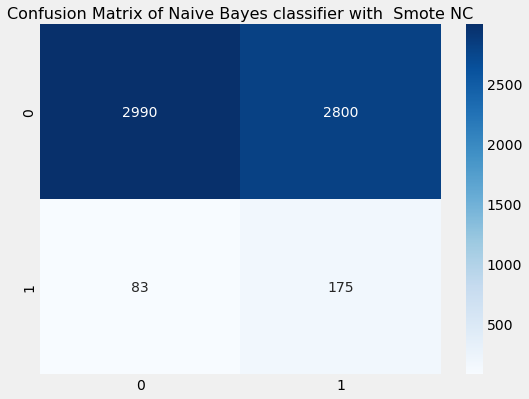

In [91]:
nb_classifier_sm = nbModel_grid_sm.best_estimator_
y_pred_nb_sm = nb_classifier_sm.predict(X_test)

# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, y_pred_nb_sm):.2f}\nRecall =  {recall_score(Y_test,y_pred_nb_sm):.2f}\nF1  = {f1_score(Y_test,y_pred_nb_sm):.2f}\nPrecision = {precision_score(Y_test,y_pred_nb_sm):.2f}\nAUC = {roc_auc_score(Y_test,y_pred_nb_sm):.2f}')
cm = confusion_matrix(Y_test,y_pred_nb_sm)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of Naive Bayes classifier with  Smote NC', size=16)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('confusion_matrix_nb_sm.jpeg')
plt.show()

In [92]:
result_after_smote = result_after_smote.append({'Classifiers':"Naive Bayes Model",
                                        'Accuracy':accuracy_score(Y_test, y_pred_nb_sm), 
                                        'Recal':recall_score(Y_test,y_pred_nb_sm), 
                                        'F1':f1_score(Y_test,y_pred_nb_sm),
                                        'Precision':precision_score(Y_test,y_pred_nb_sm),
                                        "AUC" : roc_auc_score(Y_test,y_pred_nb_sm)}, ignore_index=True)
result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914
1,Polynomial Logistic Regression,0.956184,0.000000,0.000000,0.000000,0.499396
2,Logistic regression with FAMD,0.531581,0.674419,0.109400,0.059528,0.599817
3,Lasso regression,0.715278,0.449612,0.118731,0.068396,0.588364
4,Polynomial Lasso Regression,0.780589,0.364341,0.124092,0.074781,0.581739
5,Ridge regression,0.715774,0.453488,0.119816,0.069027,0.590475
6,Polynomial Ridge Regression,0.789021,0.368217,0.129604,0.078642,0.587995
7,GAM Model,0.669643,0.538760,0.122144,0.068880,0.607117
8,Naive Bayes Model,0.523313,0.678295,0.108259,0.058824,0.597351


## <center> **K-Nearest Neighbors**</center>

### <center> **Before Smote**</center>


In [93]:
#hyperparameters tunning
parameters ={"n_neighbors": range(1, 50),
             "weights": ["uniform", "distance"]
             }

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=1)
knn_gridsearch = GridSearchCV(KNeighborsClassifier(), parameters, cv=cv,error_score=0, scoring='f1')
knn_gridsearch.fit(X_train, Y_train.values.ravel())

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=1),
             error_score=0, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': range(1, 50),
                         'weights': ['uniform', 'distance']},
             scoring='f1')

In [94]:
knn_gridsearch.best_params_

{'n_neighbors': 1, 'weights': 'uniform'}

In [95]:
Y_pred_Knn_grid = knn_gridsearch.predict(X_test)

Accuracy = 0.92
Recall =  0.07
F1  = 0.06
Precision = 0.06
AUC = 0.51


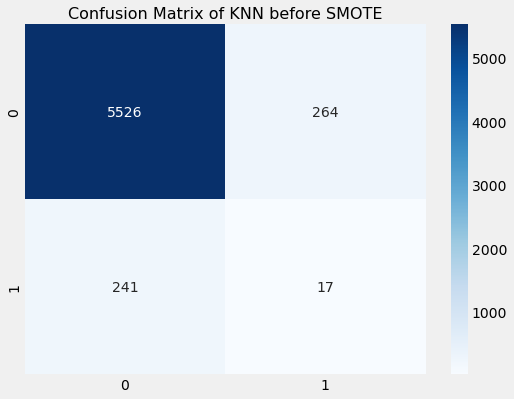

In [96]:
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, Y_pred_Knn_grid):.2f}\nRecall =  {recall_score(Y_test,Y_pred_Knn_grid):.2f}\nF1  = {f1_score(Y_test,Y_pred_Knn_grid):.2f}\nPrecision = {precision_score(Y_test,Y_pred_Knn_grid):.2f}\nAUC = {roc_auc_score(Y_test,Y_pred_Knn_grid):.2f}')
cm = confusion_matrix(Y_test,Y_pred_Knn_grid)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of KNN before SMOTE', size=16)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('knn_before_sm.jpeg')
plt.show()

In [97]:
result_before_smote = result_before_smote.append({'Classifiers':"K-Nearest Neighbors",
                                        'Accuracy':accuracy_score(Y_test, Y_pred_Knn_grid), 
                                        'Recal':recall_score(Y_test,Y_pred_Knn_grid), 
                                        'F1':f1_score(Y_test,Y_pred_Knn_grid),
                                        'Precision':precision_score(Y_test,Y_pred_Knn_grid),
                                        "AUC" : roc_auc_score(Y_test,Y_pred_Knn_grid)}, ignore_index=True)

result_before_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.957341,0.000000,0.00000,0.000000,0.500000
1,Lasso regression,0.957341,0.000000,0.00000,0.000000,0.500000
2,Ridge regression,0.957341,0.000000,0.00000,0.000000,0.500000
3,Naive Bayes,0.953704,0.000000,0.00000,0.000000,0.498100
4,K-Nearest Neighbors,0.916501,0.065891,0.06308,0.060498,0.510148


### <center> **After Smote**</center>


In [98]:
parameters ={"n_neighbors": range(1, 50),
             "weights": ["uniform", "distance"]
             }

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=1)
knn_gridsearch_sm = GridSearchCV(KNeighborsClassifier(), parameters, cv=cv,error_score=0, scoring='f1')
knn_gridsearch_sm.fit(X_sm, y_sm.values.ravel())

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=2, n_splits=5, random_state=1),
             error_score=0, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': range(1, 50),
                         'weights': ['uniform', 'distance']},
             scoring='f1')

In [99]:
knn_gridsearch_sm.best_params_

{'n_neighbors': 1, 'weights': 'uniform'}

In [100]:
Y_pred_knn_grid_sm = knn_gridsearch_sm.predict(X_test)

Accuracy = 0.74
Recall =  0.29
F1  = 0.09
Precision = 0.05
AUC = 0.52


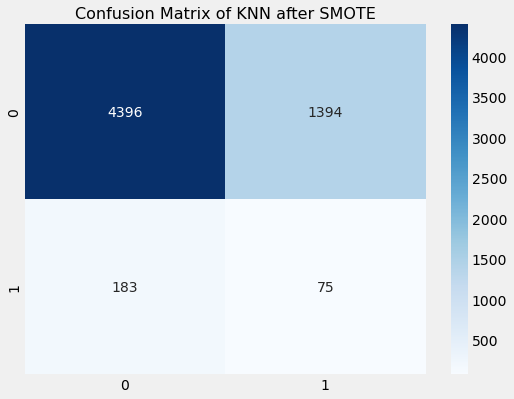

In [101]:
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, Y_pred_knn_grid_sm):.2f}\nRecall =  {recall_score(Y_test,Y_pred_knn_grid_sm):.2f}\nF1  = {f1_score(Y_test,Y_pred_knn_grid_sm):.2f}\nPrecision = {precision_score(Y_test,Y_pred_knn_grid_sm):.2f}\nAUC = {roc_auc_score(Y_test,Y_pred_knn_grid_sm):.2f}')
cm = confusion_matrix(Y_test,Y_pred_knn_grid_sm)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of KNN after SMOTE', size=16)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('knn_after_sm.jpeg')
plt.show()

In [102]:
result_after_smote = result_after_smote.append({'Classifiers':"K-Nearest Neighbors",
                                        'Accuracy':accuracy_score(Y_test, Y_pred_knn_grid_sm), 
                                        'Recal':recall_score(Y_test,Y_pred_knn_grid_sm), 
                                        'F1':f1_score(Y_test,Y_pred_knn_grid_sm),
                                        'Precision':precision_score(Y_test,Y_pred_knn_grid_sm),
                                        "AUC" : roc_auc_score(Y_test,Y_pred_knn_grid_sm)}, ignore_index=True)

result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914
1,Polynomial Logistic Regression,0.956184,0.000000,0.000000,0.000000,0.499396
2,Logistic regression with FAMD,0.531581,0.674419,0.109400,0.059528,0.599817
3,Lasso regression,0.715278,0.449612,0.118731,0.068396,0.588364
4,Polynomial Lasso Regression,0.780589,0.364341,0.124092,0.074781,0.581739
5,Ridge regression,0.715774,0.453488,0.119816,0.069027,0.590475
6,Polynomial Ridge Regression,0.789021,0.368217,0.129604,0.078642,0.587995
7,GAM Model,0.669643,0.538760,0.122144,0.068880,0.607117
8,Naive Bayes Model,0.523313,0.678295,0.108259,0.058824,0.597351
9,K-Nearest Neighbors,0.739253,0.290698,0.086856,0.051055,0.524969


## <center> **Neural  Network**</center>

In this section we applied deep learning model and utilized the weight parameter to handle imbalanced dataset

### <center> **Before Smote**</center>

In [103]:
# build a model
model = Sequential()
model.add(Dense(80, input_shape=(X_sm.shape[1],), activation='relu')) # Add an input shape! (features,)
model.add(Dense(80, input_shape=(X_sm.shape[1],), activation='relu')) # Add an input shape! (features,)
model.add(Dense(50, activation='relu'))
model.add(Dense(50, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.summary() 

# compile the model
model.compile(optimizer='Adam', 
              loss='binary_crossentropy',
              metrics=['accuracy'])

# early stopping callback
# This callback will stop the training when there is no improvement in  
# the validation loss for 10 consecutive epochs.  
es = EarlyStopping(monitor='val_loss', 
                                   mode='max', # don't minimize the accuracy!
                                   patience=10,
                                   restore_best_weights=True)


# fit model
weights = {0:0.045, 1:0.955}
# now we just update our model fit call
history = model.fit(X_train,
                    Y_train,
                    callbacks=[es],
                    epochs=80, # you can set this to a big number!
                    batch_size=10,
                    validation_split=0.2,
                    class_weight=weights,
                    shuffle=True,
                    verbose=1)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 80)                2560      
                                                                 
 dense_1 (Dense)             (None, 80)                6480      
                                                                 
 dense_2 (Dense)             (None, 50)                4050      
                                                                 
 dense_3 (Dense)             (None, 50)                2550      
                                                                 
 dense_4 (Dense)             (None, 1)                 51        
                                                                 
Total params: 15,691
Trainable params: 15,691
Non-trainable params: 0
_________________________________________________________________
Epoch 1/80
1129/1129 [==============================

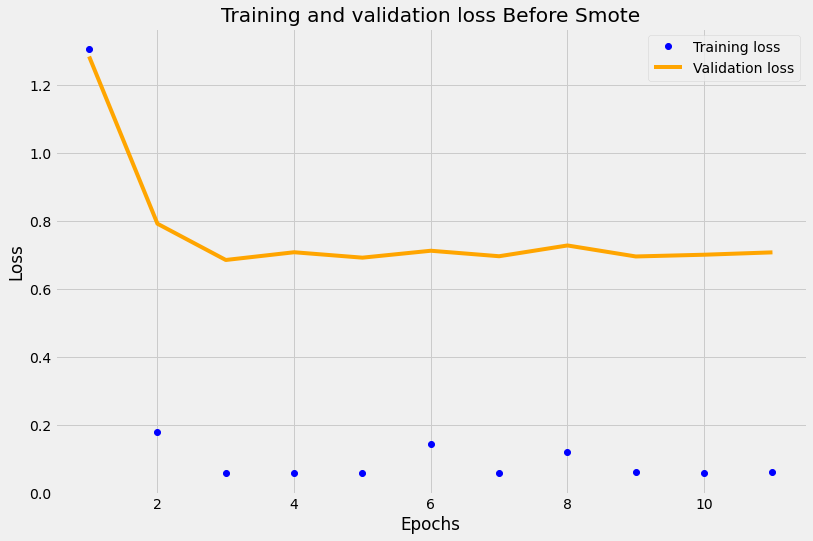

In [104]:
#Model Evaluation
history_dict = history.history
# Learning curve(Loss)
# let's see the training and validation loss by epoch

# loss
loss_values = history_dict['loss'] # you can change this
val_loss_values = history_dict['val_loss'] # you can also change this

# range of X (no. of epochs)
epochs = range(1, len(loss_values) + 1) 

# plot
plt.figure(figsize=(12,8))
plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'orange', label='Validation loss')
plt.title('Training and validation loss Before Smote')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.savefig('trainvallossbeforsm.jpeg')
plt.legend()
plt.show()


In [105]:
# see how these are numbers between 0 and 1? 
model.predict(X_test) # prob of successes (survival)
np.round(model.predict(X_test),0) # 1 and 0 (survival or not)

preds_NN_before_sm = np.round(model.predict(X_test),0)

Accuracy = 0.05
Recall =  1.00
F1  = 0.08
Precision = 0.04
AUC = 0.51


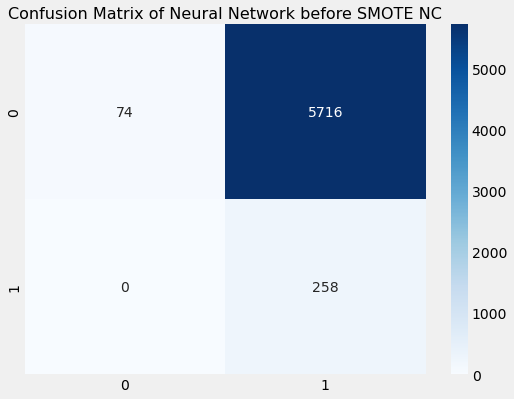

In [106]:
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, preds_NN_before_sm):.2f}\nRecall =  {recall_score(Y_test,preds_NN_before_sm):.2f}\nF1  = {f1_score(Y_test,preds_NN_before_sm):.2f}\nPrecision = {precision_score(Y_test,preds_NN_before_sm):.2f}\nAUC = {roc_auc_score(Y_test,preds_NN_before_sm):.2f}')
cm = confusion_matrix(Y_test,preds_NN_before_sm)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of Neural Network before SMOTE NC', size=16)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('cm_logistic_nosmote')
plt.show()

In [107]:
result_before_smote = result_before_smote.append({'Classifiers':"Neural Network",
                                        'Accuracy':accuracy_score(Y_test, preds_NN_before_sm), 
                                        'Recal':recall_score(Y_test,preds_NN_before_sm), 
                                        'F1':f1_score(Y_test,preds_NN_before_sm),
                                        'Precision':precision_score(Y_test,preds_NN_before_sm),
                                        "AUC" : roc_auc_score(Y_test,preds_NN_before_sm)}, ignore_index=True)

result_before_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.957341,0.000000,0.000000,0.000000,0.500000
1,Lasso regression,0.957341,0.000000,0.000000,0.000000,0.500000
2,Ridge regression,0.957341,0.000000,0.000000,0.000000,0.500000
3,Naive Bayes,0.953704,0.000000,0.000000,0.000000,0.498100
4,K-Nearest Neighbors,0.916501,0.065891,0.063080,0.060498,0.510148
5,Neural Network,0.054894,1.000000,0.082798,0.043187,0.506390


### <center> **After Smote**</center>

In [108]:

# build a model
model = Sequential()
model.add(Dense(80, input_shape=(X_sm.shape[1],), activation='relu')) # Add an input shape! (features,)
model.add(Dense(80, input_shape=(X_sm.shape[1],), activation='relu')) # Add an input shape! (features,)
model.add(Dense(50, activation='relu'))
model.add(Dense(50, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.summary() 

# compile the model
model.compile(optimizer='Adam', 
              loss='binary_crossentropy',
              metrics=['accuracy'])

# early stopping callback
# This callback will stop the training when there is no improvement in  
# the validation loss for 10 consecutive epochs.  
es = EarlyStopping(monitor='val_loss', 
                                   mode='max', # don't minimize the accuracy!
                                   patience=10,
                                   restore_best_weights=True)


# fit model
weights = {0:0.24, 1:0.76}
# now we just update our model fit call
history = model.fit(X_sm,
                    y_sm,
                    callbacks=[es],
                    epochs=80, # you can set this to a big number!
                    batch_size=10,
                    validation_split=0.2,
                    class_weight=weights,
                    shuffle=True,
                    verbose=1)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 80)                2560      
                                                                 
 dense_6 (Dense)             (None, 80)                6480      
                                                                 
 dense_7 (Dense)             (None, 50)                4050      
                                                                 
 dense_8 (Dense)             (None, 50)                2550      
                                                                 
 dense_9 (Dense)             (None, 1)                 51        
                                                                 
Total params: 15,691
Trainable params: 15,691
Non-trainable params: 0
_________________________________________________________________
Epoch 1/80
2158/2158 [============================

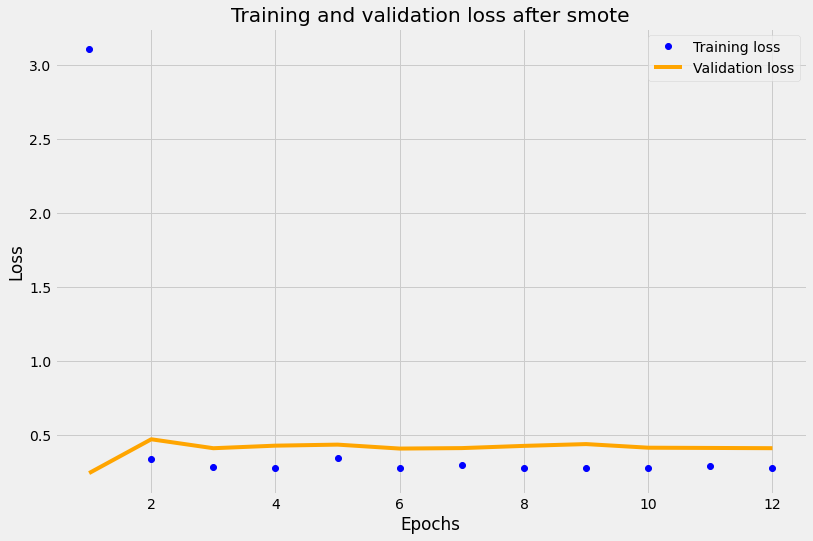

In [109]:
#Model Evaluation
history_dict = history.history
# Learning curve(Loss)
# let's see the training and validation loss by epoch

# loss
loss_values = history_dict['loss'] # you can change this
val_loss_values = history_dict['val_loss'] # you can also change this

# range of X (no. of epochs)
epochs = range(1, len(loss_values) + 1) 

# plot
plt.figure(figsize = (12,8))
plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'orange', label='Validation loss')
plt.title('Training and validation loss after smote')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.savefig('trainvalsm.jpeg')
plt.legend()
plt.show()


In [110]:
model.predict(X_test) 
np.round(model.predict(X_test),0) # 1 and 0 

preds_NN_after_sm = np.round(model.predict(X_test),0)

Accuracy = 0.06
Recall =  0.97
F1  = 0.08
Precision = 0.04
AUC = 0.49


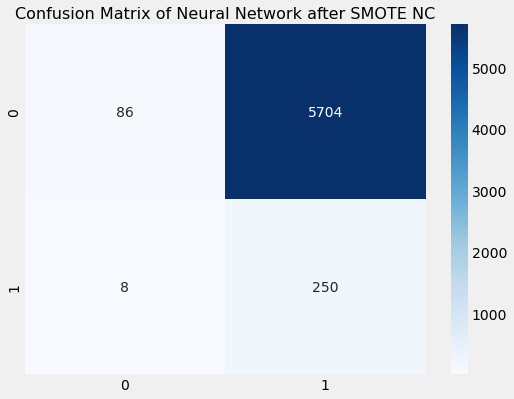

In [111]:
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, preds_NN_after_sm):.2f}\nRecall =  {recall_score(Y_test,preds_NN_after_sm):.2f}\nF1  = {f1_score(Y_test,preds_NN_after_sm):.2f}\nPrecision = {precision_score(Y_test,preds_NN_after_sm):.2f}\nAUC = {roc_auc_score(Y_test,preds_NN_after_sm):.2f}')
cm = confusion_matrix(Y_test, preds_NN_after_sm)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of Neural Network after SMOTE NC', size=16)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('cm_Neural_network')
plt.show()


In [112]:
result_after_smote = result_after_smote.append({'Classifiers':"Neural Network",
                                        'Accuracy':accuracy_score(Y_test, preds_NN_after_sm), 
                                        'Recal':recall_score(Y_test,preds_NN_after_sm), 
                                        'F1':f1_score(Y_test,preds_NN_after_sm),
                                        'Precision':precision_score(Y_test,preds_NN_after_sm),
                                        "AUC" : roc_auc_score(Y_test,preds_NN_after_sm)}, ignore_index=True)

result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914
1,Polynomial Logistic Regression,0.956184,0.000000,0.000000,0.000000,0.499396
2,Logistic regression with FAMD,0.531581,0.674419,0.109400,0.059528,0.599817
3,Lasso regression,0.715278,0.449612,0.118731,0.068396,0.588364
4,Polynomial Lasso Regression,0.780589,0.364341,0.124092,0.074781,0.581739
5,Ridge regression,0.715774,0.453488,0.119816,0.069027,0.590475
6,Polynomial Ridge Regression,0.789021,0.368217,0.129604,0.078642,0.587995
7,GAM Model,0.669643,0.538760,0.122144,0.068880,0.607117
8,Naive Bayes Model,0.523313,0.678295,0.108259,0.058824,0.597351
9,K-Nearest Neighbors,0.739253,0.290698,0.086856,0.051055,0.524969


In [119]:
result_after_smote.to_latex('result_after_sm.tex',index = False)
result_before_smote.to_latex('result_before_sm.tex',index = False)

## <center> **SVM**</center>

Unfortunately the SVM hyper- parameters tunning takes extreme amount of time which we needed to complete our report therefore we didn't do grid search cross validation, same as for the random Forest model. Hope you would understand our situation. (Training CV took more then 7 hours !!!)

### <center> **Before Smote**</center>

In [10]:
result_before_smote = Table.read('result_before_sm.tex').to_pandas()
result_after_smote = Table.read('result_after_sm.tex').to_pandas()
result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914
1,Polynomial Logistic Regression,0.956184,0.000000,0.000000,0.000000,0.499396
2,Logistic regression with FAMD,0.531581,0.674419,0.109400,0.059528,0.599817
3,Lasso regression,0.715278,0.449612,0.118731,0.068396,0.588364
4,Polynomial Lasso Regression,0.780589,0.364341,0.124092,0.074781,0.581739
5,Ridge regression,0.715774,0.453488,0.119816,0.069027,0.590475
6,Polynomial Ridge Regression,0.789021,0.368217,0.129604,0.078642,0.587995
7,GAM Model,0.669643,0.538760,0.122144,0.068880,0.607117
8,Naive Bayes Model,0.523313,0.678295,0.108259,0.058824,0.597351
9,K-Nearest Neighbors,0.739253,0.290698,0.086856,0.051055,0.524969


In [5]:
svm_before_sm = SVC()

In [6]:
svm_before_sm.fit(X_train,Y_train.values.ravel())

SVC()

In [7]:
Y_pred_svm_no_sm= svm_before_sm.predict(X_test)

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy = 0.96
Recall =  0.00
F1  = 0.00
Precision = 0.00
AUC = 0.50


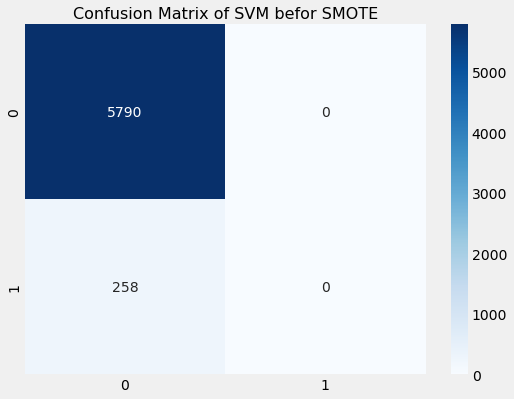

In [8]:
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, Y_pred_svm_no_sm):.2f}\nRecall =  {recall_score(Y_test,Y_pred_svm_no_sm):.2f}\nF1  = {f1_score(Y_test,Y_pred_svm_no_sm):.2f}\nPrecision = {precision_score(Y_test,Y_pred_svm_no_sm):.2f}\nAUC = {roc_auc_score(Y_test,Y_pred_svm_no_sm):.2f}')
cm = confusion_matrix(Y_test,Y_pred_svm_no_sm)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of SVM befor SMOTE', size=16)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('SVM_befor_sm.jpeg')
plt.show()

In [11]:
result_before_smote = result_before_smote.append({'Classifiers':"Support Vector Machine",
                                        'Accuracy':accuracy_score(Y_test, Y_pred_svm_no_sm), 
                                        'Recal':recall_score(Y_test,Y_pred_svm_no_sm), 
                                        'F1':f1_score(Y_test,Y_pred_svm_no_sm),
                                        'Precision':precision_score(Y_test,Y_pred_svm_no_sm),
                                        "AUC" : roc_auc_score(Y_test,Y_pred_svm_no_sm)}, ignore_index=True)

result_before_smote

C:\Users\sshoker\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.957341,0.000000,0.000000,0.000000,0.500000
1,Lasso regression,0.957341,0.000000,0.000000,0.000000,0.500000
2,Ridge regression,0.957341,0.000000,0.000000,0.000000,0.500000
3,Naive Bayes,0.953704,0.000000,0.000000,0.000000,0.498100
4,K-Nearest Neighbors,0.916501,0.065891,0.063080,0.060498,0.510148
5,Neural Network,0.054894,1.000000,0.082798,0.043187,0.506390
6,Support Vector Machine,0.957341,0.000000,0.000000,0.000000,0.500000
7,Support Vector Machine,0.957341,0.000000,0.000000,0.000000,0.500000


In [118]:
result_after_smote.to_latex('res_no_sm.ltx')
result_before_smote.to_latex('res_no_sm.ltx')

### <center> **After Smote**</center>

In [ ]:
param_grid = {'C': [0.1, 1, 10], 
              'gamma': [1, 0.1, 0.01],
            'kernel': ['rbf',  'linear']
              }
cv = RepeatedStratifiedKFold(n_splits=12)
svm_grid_sm = GridSearchCV(SVC(), param_grid, cv=cv,error_score=0, scoring='f1')
svm_grid_sm.fit(X_sm, y_sm.values.ravel())


## Won't run this code because it takes 10 hours !!!

In [ ]:
svm_grid_sm.best_params_

In [ ]:
Y_pred_svm_grid_sm = svm_grid_sm.predict(X_test)

In [12]:
svm_after_sm = SVC()

In [14]:
svm_after_sm.fit(X_sm,y_sm.values.ravel())

SVC()

In [15]:
Y_pred_svm_sm= svm_after_sm.predict(X_test)

Accuracy = 0.29
Recall =  0.71
F1  = 0.08
Precision = 0.04
AUC = 0.49


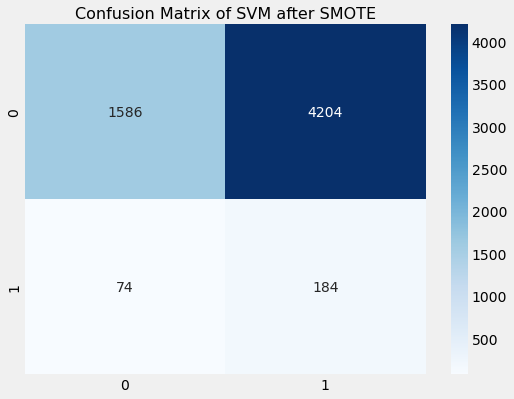

In [17]:
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, Y_pred_svm_sm):.2f}\nRecall =  {recall_score(Y_test,Y_pred_svm_sm):.2f}\nF1  = {f1_score(Y_test,Y_pred_svm_sm):.2f}\nPrecision = {precision_score(Y_test,Y_pred_svm_sm):.2f}\nAUC = {roc_auc_score(Y_test,Y_pred_svm_sm):.2f}')
cm = confusion_matrix(Y_test,Y_pred_svm_sm)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of SVM after SMOTE', size=16)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('SVM_after_sm.jpeg')
plt.show()

In [18]:
result_after_smote = result_after_smote.append({'Classifiers':"Support Vector Machine",
                                        'Accuracy':accuracy_score(Y_test, Y_pred_svm_sm), 
                                        'Recal':recall_score(Y_test,Y_pred_svm_sm), 
                                        'F1':f1_score(Y_test,Y_pred_svm_sm),
                                        'Precision':precision_score(Y_test,Y_pred_svm_sm),
                                        "AUC" : roc_auc_score(Y_test,Y_pred_svm_sm)}, ignore_index=True)

result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914
1,Polynomial Logistic Regression,0.956184,0.000000,0.000000,0.000000,0.499396
2,Logistic regression with FAMD,0.531581,0.674419,0.109400,0.059528,0.599817
3,Lasso regression,0.715278,0.449612,0.118731,0.068396,0.588364
4,Polynomial Lasso Regression,0.780589,0.364341,0.124092,0.074781,0.581739
5,Ridge regression,0.715774,0.453488,0.119816,0.069027,0.590475
6,Polynomial Ridge Regression,0.789021,0.368217,0.129604,0.078642,0.587995
7,GAM Model,0.669643,0.538760,0.122144,0.068880,0.607117
8,Naive Bayes Model,0.523313,0.678295,0.108259,0.058824,0.597351
9,K-Nearest Neighbors,0.739253,0.290698,0.086856,0.051055,0.524969


## <center> **Random Forest**</center>

### <center> **Before Smote**</center>

In [ ]:
param_grid = { 
    'n_estimators': [200, 500,1000],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,10,100,500]
}
cv = RepeatedStratifiedKFold(n_splits=5)

In [ ]:
CV_rf = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= cv, scoring='f1',error_score=0)
CV_rf.fit(X_train, Y_train.values.ravel())
# summarize results
print("Best: %f using %s" % (CV_rf.best_score_, CV_rf.best_params_))
means = CV_rf.cv_results_['mean_test_score']
stds = CV_rf.cv_results_['std_test_score']
params = CV_rf.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

In [ ]:
CV_rf.best_params_

We apologise but also we ran out of time to do grid search for random forest.

In [23]:
rfc=RandomForestClassifier(n_estimators = 400, min_samples_split = 3 , random_state=42)

In [24]:
rf_before_smote = rfc.fit(X_train,Y_train.values.ravel())

In [25]:
Y_pred_rf_before_sm = rf_before_smote.predict(X_test)

Accuracy = 0.96
Recall =  0.00
F1  = 0.00
Precision = 0.00
AUC = 0.50


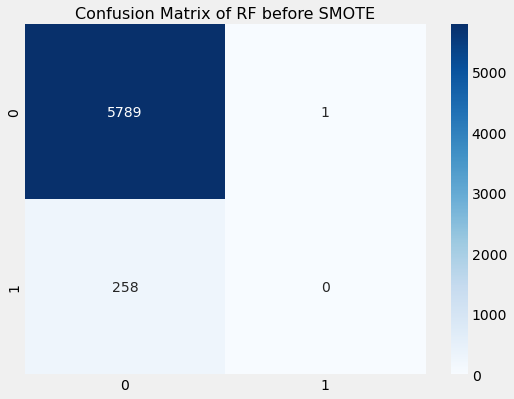

In [26]:
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, Y_pred_rf_before_sm):.2f}\nRecall =  {recall_score(Y_test,Y_pred_rf_before_sm):.2f}\nF1  = {f1_score(Y_test,Y_pred_rf_before_sm):.2f}\nPrecision = {precision_score(Y_test,Y_pred_rf_before_sm):.2f}\nAUC = {roc_auc_score(Y_test,Y_pred_rf_before_sm):.2f}')
cm = confusion_matrix(Y_test,Y_pred_rf_before_sm)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of RF before SMOTE', size=16)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('rf_before_sm.jpeg')
plt.show()

In [28]:
result_before_smote = result_before_smote.append({'Classifiers':"Random Forest",
                                        'Accuracy':accuracy_score(Y_test, Y_pred_rf_before_sm), 
                                        'Recal':recall_score(Y_test,Y_pred_rf_before_sm), 
                                        'F1':f1_score(Y_test,Y_pred_rf_before_sm),
                                        'Precision':precision_score(Y_test,Y_pred_rf_before_sm),
                                        "AUC" : roc_auc_score(Y_test,Y_pred_rf_before_sm)}, ignore_index=True)

result_before_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.957341,0.000000,0.000000,0.000000,0.500000
1,Lasso regression,0.957341,0.000000,0.000000,0.000000,0.500000
2,Ridge regression,0.957341,0.000000,0.000000,0.000000,0.500000
3,Naive Bayes,0.953704,0.000000,0.000000,0.000000,0.498100
4,K-Nearest Neighbors,0.916501,0.065891,0.063080,0.060498,0.510148
5,Neural Network,0.054894,1.000000,0.082798,0.043187,0.506390
6,Support Vector Machine,0.957341,0.000000,0.000000,0.000000,0.500000
7,Support Vector Machine,0.957341,0.000000,0.000000,0.000000,0.500000
8,Random Forest,0.957176,0.000000,0.000000,0.000000,0.499914


We observe that even after increasing the number of estimator and decreasing the minimum sample sample RF before smote is enable to predict any true positive value in test set.

### <center> **After Smote**</center>

In [ ]:
CV_rf_sm = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= cv, scoring='f1',error_score=0)
CV_rf_sm.fit(X_sm, y_sm.values.ravel())
# summarize results
print("Best: %f using %s" % (CV_rf_sm.best_score_, CV_rf_sm.best_params_))
means = CV_rf_sm.cv_results_['mean_test_score']
stds = CV_rf_sm.cv_results_['std_test_score']
params = CV_rf_sm.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Also didn't have time to complete training model with grid search CV. 

In [34]:
rfc=RandomForestClassifier(n_estimators = 200, min_samples_split = 3 , random_state=42)

In [35]:
rf_after_smote = rfc.fit(X_sm,y_sm.values.ravel())

In [36]:
Y_pred_rf__sm = rf_after_smote.predict(X_test)

Accuracy = 0.90
Recall =  0.12
F1  = 0.09
Precision = 0.07
AUC = 0.53


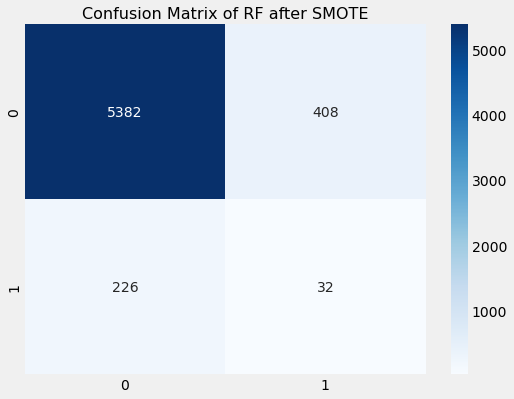

In [37]:
# Evaluate
print(f'Accuracy = {accuracy_score(Y_test, Y_pred_rf__sm):.2f}\nRecall =  {recall_score(Y_test,Y_pred_rf__sm):.2f}\nF1  = {f1_score(Y_test,Y_pred_rf__sm):.2f}\nPrecision = {precision_score(Y_test,Y_pred_rf__sm):.2f}\nAUC = {roc_auc_score(Y_test,Y_pred_rf__sm):.2f}')
cm = confusion_matrix(Y_test,Y_pred_rf__sm)
plt.figure(figsize=(8, 6))
plt.title('Confusion Matrix of RF after SMOTE', size=16)

sns.heatmap(cm, annot=True, cmap='Blues', fmt='g');
plt.savefig('rf_after_sm.jpeg')
plt.show()

In [38]:
result_after_smote = result_after_smote.append({'Classifiers':"Random Forest",
                                        'Accuracy':accuracy_score(Y_test, Y_pred_rf__sm), 
                                        'Recal':recall_score(Y_test,Y_pred_rf__sm), 
                                        'F1':f1_score(Y_test,Y_pred_rf__sm),
                                        'Precision':precision_score(Y_test,Y_pred_rf__sm),
                                        "AUC" : roc_auc_score(Y_test,Y_pred_rf__sm)}, ignore_index=True)

result_after_smote

,Classifiers,Accuracy,Recal,F1,Precision,AUC
0,Logistic regression,0.725694,0.472868,0.128219,0.074164,0.604914
1,Polynomial Logistic Regression,0.956184,0.000000,0.000000,0.000000,0.499396
2,Logistic regression with FAMD,0.531581,0.674419,0.109400,0.059528,0.599817
3,Lasso regression,0.715278,0.449612,0.118731,0.068396,0.588364
4,Polynomial Lasso Regression,0.780589,0.364341,0.124092,0.074781,0.581739
5,Ridge regression,0.715774,0.453488,0.119816,0.069027,0.590475
6,Polynomial Ridge Regression,0.789021,0.368217,0.129604,0.078642,0.587995
7,GAM Model,0.669643,0.538760,0.122144,0.068880,0.607117
8,Naive Bayes Model,0.523313,0.678295,0.108259,0.058824,0.597351
9,K-Nearest Neighbors,0.739253,0.290698,0.086856,0.051055,0.524969


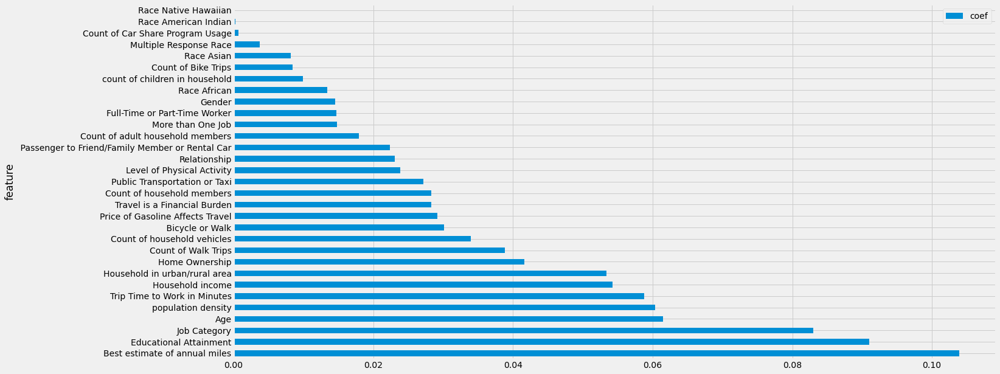

In [39]:
importances = rf_after_smote.feature_importances_
sorted_indices = np.argsort(importances)[::-1]
plt.rcParams["figure.figsize"] = (20,10)
 
#plt.title('Feature Importance')
feature_importance = pd.DataFrame(X_train.columns, columns = ["feature"])
feature_importance["coef"] =  importances
feature_importance = feature_importance.sort_values(by = ["coef"], ascending=False)
 
ax = feature_importance.plot.barh(x='feature', y='coef')
plt.savefig('Featureimportance_rf.jpeg')
plt.show()

# <center> The END

In [43]:
result_after_smote.round(2).to_latex('result_after_smote.tex', index = False)

In [44]:
result_before_smote.round(2).to_latex('result_before_smote.tex', index = False)